# Energy system model of the Spain

In [56]:
import calliope
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

calliope.set_log_verbosity("INFO", include_solver_output=True)

# 1. Reference case
### 1.1. Create and solve the model

In [57]:
model_1 = calliope.read_yaml('model/model.yaml',scenario='base')

[2025-12-15 15:48:56] INFO     Loading overrides from scenario: base 
[2025-12-15 15:48:56] INFO     (scenarios, base ) | Applying the following overrides: [].
[2025-12-15 15:48:56] INFO     Math init | loading pre-defined math.
[2025-12-15 15:48:56] INFO     Math init | loading math files {'milp', 'base', 'spores', 'storage_inter_cluster', 'operate'}.
[2025-12-15 15:48:56] INFO     Model: preprocessing data


[2025-12-15 15:48:56] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-15 15:48:56] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:48:56] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:48:56] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:48:56] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:48:56] INFO     Model: initialisation complete


In [58]:
model_1.inputs.sink_use_equals.to_series().dropna()

timesteps            nodes  techs       
2024-01-01 00:00:00  NLD    demand_power    21863.416667
2024-01-01 01:00:00  NLD    demand_power    21200.666667
2024-01-01 02:00:00  NLD    demand_power    20033.083333
2024-01-01 03:00:00  NLD    demand_power    18867.666667
2024-01-01 04:00:00  NLD    demand_power    18137.166667
                                                ...     
2024-12-30 19:00:00  NLD    demand_power    32269.333333
2024-12-30 20:00:00  NLD    demand_power    32806.250000
2024-12-30 21:00:00  NLD    demand_power    32516.666667
2024-12-30 22:00:00  NLD    demand_power    30309.833333
2024-12-30 23:00:00  NLD    demand_power    27405.333333
Name: sink_use_equals, Length: 8759, dtype: float64

In [59]:
model_1.build()
model_1.solve()

[2025-12-15 15:48:56] INFO     Model: backend build starting
[2025-12-15 15:48:57] INFO     Optimisation Model | parameters/lookups | Generated.
[2025-12-15 15:48:57] INFO     Optimisation Model | variables | Generated.
[2025-12-15 15:48:59] INFO     Optimisation Model | global_expressions | Generated.
[2025-12-15 15:49:06] INFO     Optimisation Model | constraints | Generated.
[2025-12-15 15:49:06] INFO     Optimisation Model | piecewise_constraints | Generated.
[2025-12-15 15:49:06] INFO     Optimisation Model | objectives | Generated.
[2025-12-15 15:49:06] INFO     Model: backend build complete
[2025-12-15 15:49:11] INFO     Optimisation model | starting model in base mode.
[2025-12-15 15:49:17] DEBUG    Read LP format model from file C:\Users\yaowa\AppData\Local\Temp\tmph_rishpq.pyomo.lp
Reading time = 0.57 seconds
x1: 227753 rows, 140160 columns, 411707 nonzeros
Set parameter QCPDual to value 1
Set parameter Threads to value 6
Set parameter Method to value 2
Set parameter Crossove

In [60]:
# It is helpful to store the model results as a whole in NetCDF format, which Calliope can import back
# at any later time. 
model_1.to_netcdf('results/default_results.nc')

In [61]:
# Alternatively, results can be exported as a series of .csv files for inspection and analysis in Excel or
# other software that may benefit from .csv data
#model_1.to_csv('results/default_results_csv')

### 1.2. Marginal technology

In [62]:
# Shadow price for the power system balance constraint
balance_price_1 = model_1.backend.shadow_prices.get("system_balance").to_series().reset_index()
balance_price_1.head()

,nodes,carriers,timesteps,system_balance
0,NLD,power,2024-01-01 00:00:00,0.007627
1,NLD,power,2024-01-01 01:00:00,0.007627
2,NLD,power,2024-01-01 02:00:00,0.007627
3,NLD,power,2024-01-01 03:00:00,0.007627
4,NLD,power,2024-01-01 04:00:00,0.007627


<Axes: >

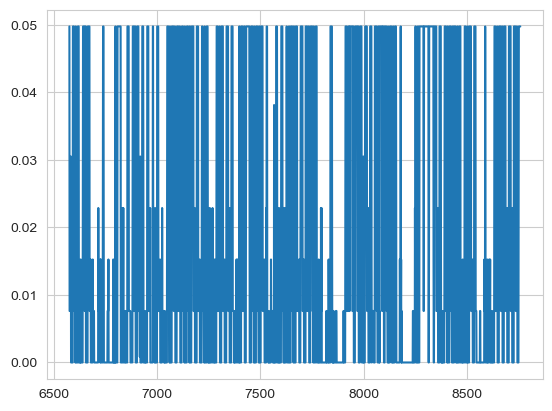

In [63]:
# Create a Date Range to select October to inspect visually
days_of_interest = pd.date_range('2024-10-01','2024-12-31',freq='h') 
# Plot the days of interest
balance_price_1['system_balance'].loc[balance_price_1['timesteps'].isin(days_of_interest)].plot()

We need to determine which technology's marginal cost serves as the shadow price for market balancing.

In [64]:
variable_costs_1 = model_1.results.cost_operation_variable.to_series().dropna()
generation_1 = model_1.results.flow_out.to_series().dropna()
# hour and the marginal cost of the marginal generator in the merit order
marginal_generation_costs_1 = variable_costs_1/generation_1

# tranform to a DataFrame
marginal_generation_costs_1 = marginal_generation_costs_1.reset_index()

# change column name '0' to 'marginal_generation_cost'
marginal_generation_costs_1 = marginal_generation_costs_1.rename(columns={0: 'marginal_generation_cost'})
marginal_generation_costs_1.head()

,nodes,techs,costs,timesteps,carriers,marginal_generation_cost
0,NLD,ccgt,monetary,2024-01-01 00:00:00,power,0.049768
1,NLD,ccgt,monetary,2024-01-01 01:00:00,power,0.049768
2,NLD,ccgt,monetary,2024-01-01 02:00:00,power,0.049768
3,NLD,ccgt,monetary,2024-01-01 03:00:00,power,0.049768
4,NLD,ccgt,monetary,2024-01-01 04:00:00,power,0.049768


In [65]:
# Merge marginal generation costs with balance price
merged_1 = marginal_generation_costs_1.merge(
    balance_price_1,
    on=['nodes', 'carriers', 'timesteps'],
    how='inner'
)
merged_1.head()

,nodes,techs,costs,timesteps,carriers,marginal_generation_cost,system_balance
0,NLD,ccgt,monetary,2024-01-01 00:00:00,power,0.049768,0.007627
1,NLD,ccgt,monetary,2024-01-01 01:00:00,power,0.049768,0.007627
2,NLD,ccgt,monetary,2024-01-01 02:00:00,power,0.049768,0.007627
3,NLD,ccgt,monetary,2024-01-01 03:00:00,power,0.049768,0.007627
4,NLD,ccgt,monetary,2024-01-01 04:00:00,power,0.049768,0.007627


In [66]:
merged_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61320 entries, 0 to 61319
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     61320 non-null  object        
 1   techs                     61320 non-null  object        
 2   costs                     61320 non-null  object        
 3   timesteps                 61320 non-null  datetime64[ns]
 4   carriers                  61320 non-null  object        
 5   marginal_generation_cost  44190 non-null  float64       
 6   system_balance            61320 non-null  object        
dtypes: datetime64[ns](1), float64(1), object(5)
memory usage: 3.3+ MB


In [67]:
# turn system_balance and marginal_generation_cost into float type
merged_1['system_balance'] = merged_1['system_balance'].astype(float)
merged_1['marginal_generation_cost'] = merged_1['marginal_generation_cost'].astype(float)

# drop rows with NaN values in marginal_generation_cost
merged_1 = merged_1.dropna(subset=['marginal_generation_cost'])
merged_1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 44190 entries, 0 to 61319
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     44190 non-null  object        
 1   techs                     44190 non-null  object        
 2   costs                     44190 non-null  object        
 3   timesteps                 44190 non-null  datetime64[ns]
 4   carriers                  44190 non-null  object        
 5   marginal_generation_cost  44190 non-null  float64       
 6   system_balance            44190 non-null  float64       
dtypes: datetime64[ns](1), float64(2), object(4)
memory usage: 2.7+ MB


In [68]:
# Compute absolute difference between marginal cost and price
merged_1['diff'] = (merged_1['marginal_generation_cost'] - merged_1['system_balance']).abs()

# Show the technology with the smallest difference for each timestep and node
marginal_tech_1 = (
    merged_1.sort_values('diff')
          .groupby(['timesteps', 'nodes'], as_index=False)
          .first()[['timesteps', 'nodes', 'techs',
                    'marginal_generation_cost', 'system_balance', 'diff']]
)
marginal_tech_1.head()


,timesteps,nodes,techs,marginal_generation_cost,system_balance,diff
0,2024-01-01 00:00:00,NLD,nuclear,0.007627,0.007627,1.997562e-09
1,2024-01-01 01:00:00,NLD,nuclear,0.007627,0.007627,2.606795e-09
2,2024-01-01 02:00:00,NLD,nuclear,0.007627,0.007627,1.466847e-09
3,2024-01-01 03:00:00,NLD,nuclear,0.007627,0.007627,5.394662e-09
4,2024-01-01 04:00:00,NLD,nuclear,0.007627,0.007627,6.912039e-09


In [69]:
tech_colors = {
    "load_shedding": "#000000",
    "ccgt": "#E37A72",
    "nuclear": "#F3007A",
    "hydro": "#7900f3",
    "solar_pv": "#F9D956",
    "wind_onshore": "#56F9C0",
    "wind_offshore": "#56CBF9"
}

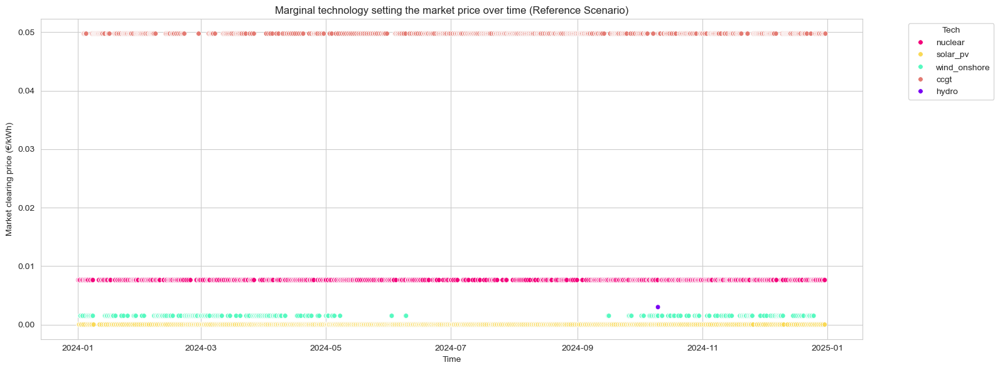

In [70]:
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(16, 6))

sns.scatterplot(
    data=marginal_tech_1,
    x='timesteps',
    y='marginal_generation_cost',
    hue='techs',
    palette=tech_colors,  
    s=30,  # marker size (larger than 18 for visibility)
    ax=ax
)

ax.set_xlabel("Time")
ax.set_ylabel("Market clearing price (€/kWh)")
ax.set_title("Marginal technology setting the market price over time (Reference Scenario)")
ax.legend(title="Tech", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

techs
solar_pv        3442
ccgt            2626
nuclear         1851
wind_onshore     840
hydro              1
Name: count, dtype: int64
techs
solar_pv        0.392922
ccgt            0.299772
nuclear         0.211301
wind_onshore    0.095890
hydro           0.000114
Name: share, dtype: float64
[2025-12-15 15:49:24] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_27956\3826040512.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



[2025-12-15 15:49:25] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_27956\3826040512.py:24: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.




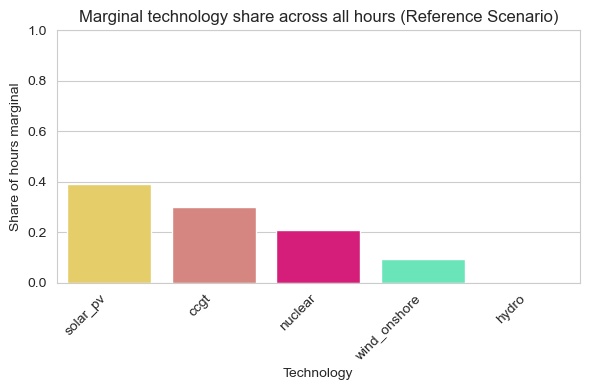

In [71]:
# Count how many hours each tech is marginal
freq = marginal_tech_1['techs'].value_counts().sort_values(ascending=False)
print(freq)
share = (freq / freq.sum()).rename('share')
print(share)

share_df = share.reset_index()
share_df.columns = ['techs', 'share']

fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=share_df,
    x='techs',
    y='share',
    palette=[tech_colors.get(tech, 'gray') for tech in share_df['techs']],
    ax=ax
)

ax.set_ylabel('Share of hours marginal')
ax.set_xlabel('Technology')
ax.set_ylim(0, 1)
ax.set_title('Marginal technology share across all hours (Reference Scenario)')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.show()

### 1.3. Dispatch per power plant type

In this example, we provide some pre-made plotting functionalities in the 'plotting_utilities.py' file, which you can import and apply as well as use as an example for making your own custom plots.

In [72]:
# Import some pre-made plotting functionalities as an example. You can use these, make your own, or simply
# create plots with your favourite Python library or non-Python tool, such as Excel
from plotting_utilities import plot_dispatch,plot_load_duration_curve

In [73]:
# Dispatch plots can be generated directly from the saved model results
plot_dispatch(model_path='results/default_results.nc', plot_export_path='results/default_dispatch.html')

[2025-12-15 15:49:25] INFO     Model: preprocessing data (reentry)
[2025-12-15 15:49:25] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-15 15:49:25] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:49:25] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:49:25] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:49:25] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:49:25] INFO     Model: initialisation complete


## 1.4.  Load, residual load and price duration curves

In [74]:
gen_techs = ['solar_pv','wind_onshore', 'hydro', 'ccgt', 'nuclear'] 

In [75]:
# For generating load duration curves (LDCs), instead, we first need to import back the model results,
# then extract the time-varing variable of interest
model_1 = calliope.read_netcdf('results/default_results.nc')

[2025-12-15 15:49:26] INFO     Model: preprocessing data (reentry)
[2025-12-15 15:49:26] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-15 15:49:26] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:49:26] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:49:26] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:49:26] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:49:26] INFO     Model: initialisation complete


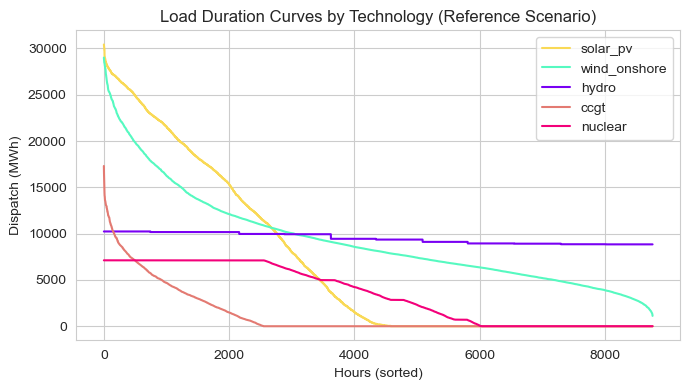

In [76]:
dispatch = {}
for tech in gen_techs:
    series = (
        model_1.results.flow_out
        .sel(techs=tech)        
        .to_series()
        .dropna()
        .sort_values(ascending=False)
        .reset_index(drop=True)
    )
    dispatch[tech] = series

# plot all LDCs for the different technologies
plt.figure(figsize=(7,4))

for tech, series in dispatch.items():
    plt.plot(series.values, label=tech, color=tech_colors.get(tech, 'black'))

plt.title("Load Duration Curves by Technology (Reference Scenario)")
plt.xlabel("Hours (sorted)")
plt.ylabel("Dispatch (MWh)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [77]:
# Suppose we want to plot the LDC of the dispatch of the CCGT power plant
#ccgt_dispatch = model.results.flow_out.sel(techs='ccgt').to_series().dropna()
#ccgt_dispatch.head()

In [78]:
#plot_load_duration_curve(dataframe=ccgt_dispatch.to_frame(), 
                         #plot_export_path='results/default_ccgt_ldc.html', 
                         #y_label='Flow out (MWh)')

In [79]:
# Or we may want the LDC of the shadow price, which we calculated earlier
plot_load_duration_curve(dataframe=balance_price_1['system_balance'].to_frame(), 
                         plot_export_path='results/default_price.html', 
                         y_label='Price (EUR/kWh)')

In [80]:
# Obtain demand from input
demand_1 = model_1.inputs.sink_use_equals.sel(techs='demand_power').to_series().dropna()

# Get the dispatch of renewables
solar_pv_dispatch_1 = model_1.results.flow_out.sel(techs='solar_pv').to_series().dropna()
wind_onshore_dispatch_1 = model_1.results.flow_out.sel(techs='wind_onshore').to_series().dropna()
# Calculate the residual load (load minus renewable generation)
residual_load_1 = demand_1 - (solar_pv_dispatch_1 + wind_onshore_dispatch_1)
residual_load_1.head()

timesteps            nodes  carriers
2024-01-01 00:00:00  NLD    power       14227.213915
2024-01-01 01:00:00  NLD    power       13855.561467
2024-01-01 02:00:00  NLD    power       12969.140277
2024-01-01 03:00:00  NLD    power       12110.037851
2024-01-01 04:00:00  NLD    power       11647.892891
dtype: float64

In [81]:
# Plot the LDC of the residual load
plot_load_duration_curve(dataframe=residual_load_1.to_frame(name='Residual Load (MWh)'),
                         plot_export_path='results/default_residual_load.html',
                         y_label='Residual Load (MWh)')


### 1.5. CO2 emissions

In [82]:
# to get hourly generation for all techs, power carrier only
power_gen_1 = model_1.results.flow_out.sel(carriers="power")   # (nodes, techs, timesteps)

In [83]:
# emission factors (tCO2 per MWh of electricity)
emission_factors = {
    "ccgt": 0.42,   # only ccgt emits co2 emissions https://www.climatiq.io/data/emission-factor/7bfab478-b1e7-4ded-9907-9f200b40f2cb
}

In [84]:
# hourly emissions by tech (keep dict for possible future extra techs but this case only involves ccgt)
hourly_emissions_by_tech = {}
total_emissions_by_tech = {}

for tech, ef in emission_factors.items():
    # hourly generation for this tech (sum over nodes)
    gen_tech = power_gen_1.sel(techs=tech).sum(dim="nodes")      # (timesteps), MWh/h

    # hourly emissions (tCO2/h)
    emis_tech = gen_tech * ef                                  # DataArray over timesteps
    hourly_emissions_by_tech[tech] = emis_tech

    # total emissions over whole period
    total_emissions_by_tech[tech] = float(emis_tech.sum())     # tCO2


In [85]:
# Total across all emitting techs
total_emissions_t_1 = sum(total_emissions_by_tech.values())

print("CO2 emissions by tech:")
for tech, val in total_emissions_by_tech.items():
    print(f"  {tech}: {val:,.2f} tCO2")

print(f"\nTotal CO2 emissions: {total_emissions_t_1:,.2f} tCO2")
print(f"Total CO2 emissions: {total_emissions_t_1/1e6:.3f} MtCO2")

CO2 emissions by tech:
  ccgt: 4,633,134.93 tCO2

Total CO2 emissions: 4,633,134.93 tCO2
Total CO2 emissions: 4.633 MtCO2


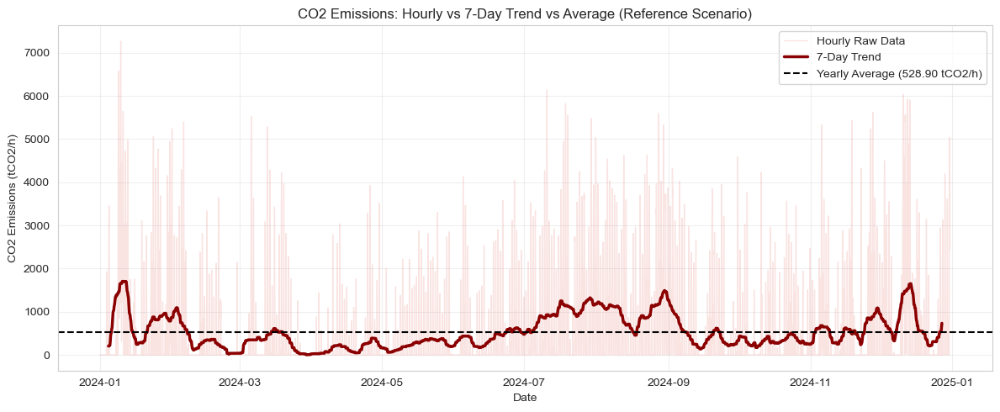

In [86]:
#plot
# convert to pandas Series with datetime index
ccgt_emissions = hourly_emissions_by_tech["ccgt"].to_series()
ccgt_emissions.index = pd.to_datetime(ccgt_emissions.index)

# 7-day rolling trend (168 hours)
trend_line = ccgt_emissions.rolling(window=168, center=True).mean()

# average over the whole period
average_val = ccgt_emissions.mean()

plt.figure(figsize=(12, 5))

# raw hourly data (faint)
plt.plot(
    ccgt_emissions.index,
    ccgt_emissions.values,
    color="#E37A72",
    alpha=0.2,
    linewidth=1,
    label="Hourly Raw Data",
)

# 7-day trend
plt.plot(
    trend_line.index,
    trend_line.values,
    color="darkred",
    linewidth=2.5,
    label="7-Day Trend",
)

# average line
plt.axhline(
    y=average_val,
    color="black",
    linestyle="--",
    linewidth=1.5,
    label=f"Yearly Average ({average_val:.2f} tCO2/h)",
)

plt.xlabel("Date")
plt.ylabel("CO2 Emissions (tCO2/h)")
plt.title("CO2 Emissions: Hourly vs 7-Day Trend vs Average (Reference Scenario)")
plt.legend(loc="upper right")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

### 1.6. Cost recovery

In [87]:
# Flow out for all gen techs in one go
dispatch_1 = (
    model_1.results.flow_out
    .sel(techs=gen_techs, carriers='power')   # carriers only if present
    .to_series()                              # -> Series with index (nodes, techs, timesteps)
    .unstack('techs')                         # techs become columns
    .reset_index()                            # timesteps as column, keep nodes
)

dispatch_1.head()


techs,nodes,timesteps,solar_pv,wind_onshore,hydro,ccgt,nuclear
0,NLD,2024-01-01 00:00:00,0.0,7636.202752,10233.511024,0.003724,3993.738939
1,NLD,2024-01-01 01:00:00,0.0,7345.105200,10233.511024,0.003731,3622.086626
2,NLD,2024-01-01 02:00:00,0.0,7063.943056,10233.511024,0.003789,2735.666903
3,NLD,2024-01-01 03:00:00,0.0,6757.628816,10233.511024,0.003928,1876.565820
4,NLD,2024-01-01 04:00:00,0.0,6489.273776,10233.511024,0.004054,1414.421622


In [88]:
# Shadow price dataframe
balance_price_1 = (
    model_1.results.shadow_price_system_balance
    .to_series().reset_index()
)

# Merge price into dispatch
df_1 = balance_price_1.merge(dispatch_1, on='timesteps', how='left')
df_1.head()

,nodes_x,carriers,timesteps,shadow_price_system_balance,nodes_y,solar_pv,wind_onshore,hydro,ccgt,nuclear
0,NLD,power,2024-01-01 00:00:00,0.007627,NLD,0.0,7636.202752,10233.511024,0.003724,3993.738939
1,NLD,power,2024-01-01 01:00:00,0.007627,NLD,0.0,7345.105200,10233.511024,0.003731,3622.086626
2,NLD,power,2024-01-01 02:00:00,0.007627,NLD,0.0,7063.943056,10233.511024,0.003789,2735.666903
3,NLD,power,2024-01-01 03:00:00,0.007627,NLD,0.0,6757.628816,10233.511024,0.003928,1876.565820
4,NLD,power,2024-01-01 04:00:00,0.007627,NLD,0.0,6489.273776,10233.511024,0.004054,1414.421622


In [89]:
# Revenue per tech = price * dispatch (hourly)
for tech in gen_techs:
    df_1[f'{tech}_revenue'] = df_1[tech] * df_1['shadow_price_system_balance']

# Total (modelled-period) revenue per tech
revenue_1 = df_1[[f'{t}_revenue' for t in gen_techs]].sum()
revenue_1.index = revenue_1.index.str.replace('_revenue', '', regex=False)
revenue_1.name = 'revenue'
revenue_1

solar_pv        1.231776e+05
wind_onshore    1.090230e+06
hydro           1.400802e+06
ccgt            5.490083e+05
nuclear         1.007174e+06
Name: revenue, dtype: float64

In [90]:
cost_1 = (
    model_1.results.cost
    .sel(techs=gen_techs)   # we only care about these
    .sum('nodes')           # if you only have one node, this just drops the dim
    .to_series()
)
cost_1 = cost_1.droplevel('costs')                # or just drop the level
cost_1.name = 'cost'
cost_1


techs
solar_pv           633.846673
wind_onshore    123857.130772
hydro           249394.176830
ccgt            549009.071604
nuclear         232933.916317
Name: cost, dtype: float64

In [91]:
# calculate profit and cost recovery ratio
covery_1 = pd.concat([revenue_1, cost_1], axis=1)
covery_1['profit'] = covery_1['revenue'] - covery_1['cost'] # >0 means revenue covers cost
covery_1['cost_recovery_ratio'] = covery_1['revenue'] / covery_1['cost']  # >1 means full recovery
covery_1

,revenue,cost,profit,cost_recovery_ratio
solar_pv,1.231776e+05,633.846673,1.225437e+05,194.333400
wind_onshore,1.090230e+06,123857.130772,9.663733e+05,8.802323
hydro,1.400802e+06,249394.176830,1.151408e+06,5.616819
ccgt,5.490083e+05,549009.071604,-7.476163e-01,0.999999
nuclear,1.007174e+06,232933.916317,7.742401e+05,4.323862


In [92]:
covery_df_1 = covery_1.reset_index()
covery_df_1.columns = ['techs', 'revenue', 'cost', 'profit', 'cost_recovery_ratio']
covery_df_1

,techs,revenue,cost,profit,cost_recovery_ratio
0,solar_pv,1.231776e+05,633.846673,1.225437e+05,194.333400
1,wind_onshore,1.090230e+06,123857.130772,9.663733e+05,8.802323
2,hydro,1.400802e+06,249394.176830,1.151408e+06,5.616819
3,ccgt,5.490083e+05,549009.071604,-7.476163e-01,0.999999
4,nuclear,1.007174e+06,232933.916317,7.742401e+05,4.323862


[2025-12-15 15:49:27] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_27956\2165061241.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



[2025-12-15 15:49:27] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_27956\2165061241.py:16: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.




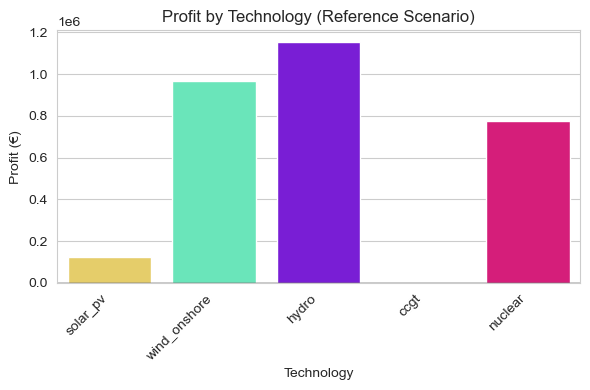

[2025-12-15 15:49:27] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_27956\2165061241.py:24: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.





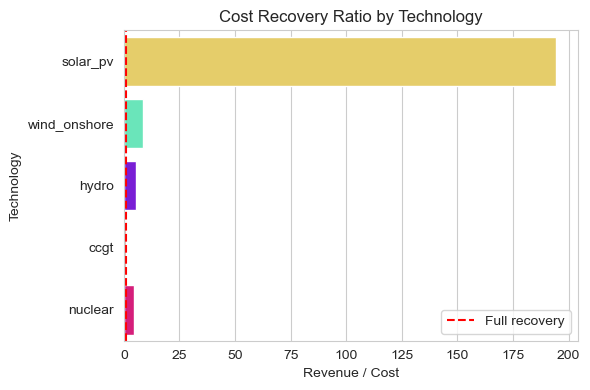

In [93]:
# --- FIGURE 1: PROFIT ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df_1,
    x="techs",
    y="profit",
    palette=tech_colors,   # use tech-specific colors
    ax=ax
)

ax.axhline(0, color="black", linewidth=1)
ax.set_title("Profit by Technology (Reference Scenario)")
ax.set_ylabel("Profit (€)")
ax.set_xlabel("Technology")
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

plt.tight_layout()
plt.show()

# --- FIGURE 2: COST RECOVERY RATIO ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df_1,
    y="techs",
    x="cost_recovery_ratio",
    palette=tech_colors,   # same colors, consistent across figures
    ax=ax
)

ax.axvline(1.0, color="red", linestyle="--", linewidth=1.5, label="Full recovery")
ax.set_title("Cost Recovery Ratio by Technology")
ax.set_xlabel("Revenue / Cost")
ax.set_ylabel("Technology")
ax.legend()

plt.tight_layout()
plt.show()

# 2. Renewables growth case
### 2.1. Reload the model with a scenario that forces a higher capacity of renewables and re-solve

In [94]:
model_2 = calliope.read_yaml('model/model.yaml',scenario='more_renewables')

[2025-12-15 15:49:27] INFO     Loading overrides from scenario: more_renewables 
[2025-12-15 15:49:27] INFO     (scenarios, more_renewables ) | Applying the following overrides: ['higher_renewables'].
[2025-12-15 15:49:27] INFO     Math init | loading pre-defined math.
[2025-12-15 15:49:27] INFO     Math init | loading math files {'milp', 'base', 'spores', 'storage_inter_cluster', 'operate'}.
[2025-12-15 15:49:27] INFO     Model: preprocessing data
[2025-12-15 15:49:27] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-15 15:49:28] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:49:28] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:49:28] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:49:28] INFO     input data `name` not defined in

In [95]:
model_2.inputs.sink_use_equals.to_series().dropna()

timesteps            nodes  techs       
2024-01-01 00:00:00  NLD    demand_power    21863.416667
2024-01-01 01:00:00  NLD    demand_power    21200.666667
2024-01-01 02:00:00  NLD    demand_power    20033.083333
2024-01-01 03:00:00  NLD    demand_power    18867.666667
2024-01-01 04:00:00  NLD    demand_power    18137.166667
                                                ...     
2024-12-30 19:00:00  NLD    demand_power    32269.333333
2024-12-30 20:00:00  NLD    demand_power    32806.250000
2024-12-30 21:00:00  NLD    demand_power    32516.666667
2024-12-30 22:00:00  NLD    demand_power    30309.833333
2024-12-30 23:00:00  NLD    demand_power    27405.333333
Name: sink_use_equals, Length: 8759, dtype: float64

In [96]:
model_2.build()
model_2.solve()

[2025-12-15 15:49:28] INFO     Model: backend build starting
[2025-12-15 15:49:29] INFO     Optimisation Model | parameters/lookups | Generated.
[2025-12-15 15:49:29] INFO     Optimisation Model | variables | Generated.
[2025-12-15 15:49:31] INFO     Optimisation Model | global_expressions | Generated.
[2025-12-15 15:49:37] INFO     Optimisation Model | constraints | Generated.
[2025-12-15 15:49:37] INFO     Optimisation Model | piecewise_constraints | Generated.
[2025-12-15 15:49:37] INFO     Optimisation Model | objectives | Generated.
[2025-12-15 15:49:37] INFO     Model: backend build complete
[2025-12-15 15:49:42] INFO     Optimisation model | starting model in base mode.
[2025-12-15 15:49:48] DEBUG    Read LP format model from file C:\Users\yaowa\AppData\Local\Temp\tmpym7m6s7b.pyomo.lp
Reading time = 0.60 seconds
x1: 227753 rows, 140160 columns, 411707 nonzeros
Set parameter QCPDual to value 1
Set parameter Threads to value 6
Set parameter Method to value 2
Set parameter Crossove

In [97]:
model_2.to_netcdf('results/more_vres.nc')

### 2.2. Marginal technology

In [98]:
# Shadow price for the power system balance constraint
balance_price_2 = model_2.backend.shadow_prices.get("system_balance").to_series().reset_index()
balance_price_2.head()

,nodes,carriers,timesteps,system_balance
0,NLD,power,2024-01-01 00:00:00,0.007627
1,NLD,power,2024-01-01 01:00:00,0.007627
2,NLD,power,2024-01-01 02:00:00,0.007627
3,NLD,power,2024-01-01 03:00:00,0.007627
4,NLD,power,2024-01-01 04:00:00,0.007627


<Axes: >

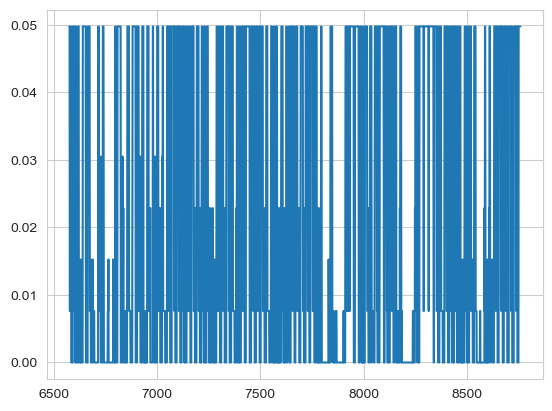

In [99]:
# Create a Date Range to select October to inspect visually
days_of_interest = pd.date_range('2024-10-01','2024-12-31',freq='h') 
# Plot the days of interest
balance_price_2['system_balance'].loc[balance_price_2['timesteps'].isin(days_of_interest)].plot()

In [100]:
variable_costs_2 = model_2.results.cost_operation_variable.to_series().dropna()
generation_2 = model_2.results.flow_out.to_series().dropna()
# hour and the marginal cost of the marginal generator in the merit order
marginal_generation_costs_2 = variable_costs_2/generation_2

# tranform to a DataFrame
marginal_generation_costs_2 = marginal_generation_costs_2.reset_index()

# change column name '0' to 'marginal_generation_cost'
marginal_generation_costs_2 = marginal_generation_costs_2.rename(columns={0: 'marginal_generation_cost'})
marginal_generation_costs_2.head()

,nodes,techs,costs,timesteps,carriers,marginal_generation_cost
0,NLD,ccgt,monetary,2024-01-01 00:00:00,power,0.049768
1,NLD,ccgt,monetary,2024-01-01 01:00:00,power,0.049768
2,NLD,ccgt,monetary,2024-01-01 02:00:00,power,0.049768
3,NLD,ccgt,monetary,2024-01-01 03:00:00,power,0.049768
4,NLD,ccgt,monetary,2024-01-01 04:00:00,power,0.049768


In [101]:
# Merge marginal generation costs with balance price
merged_2 = marginal_generation_costs_2.merge(
    balance_price_2,
    on=['nodes', 'carriers', 'timesteps'],
    how='inner'
)
merged_2.head()

,nodes,techs,costs,timesteps,carriers,marginal_generation_cost,system_balance
0,NLD,ccgt,monetary,2024-01-01 00:00:00,power,0.049768,0.007627
1,NLD,ccgt,monetary,2024-01-01 01:00:00,power,0.049768,0.007627
2,NLD,ccgt,monetary,2024-01-01 02:00:00,power,0.049768,0.007627
3,NLD,ccgt,monetary,2024-01-01 03:00:00,power,0.049768,0.007627
4,NLD,ccgt,monetary,2024-01-01 04:00:00,power,0.049768,0.007627


In [102]:
merged_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61320 entries, 0 to 61319
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     61320 non-null  object        
 1   techs                     61320 non-null  object        
 2   costs                     61320 non-null  object        
 3   timesteps                 61320 non-null  datetime64[ns]
 4   carriers                  61320 non-null  object        
 5   marginal_generation_cost  53654 non-null  float64       
 6   system_balance            61320 non-null  object        
dtypes: datetime64[ns](1), float64(1), object(5)
memory usage: 3.3+ MB


In [103]:
# turn system_balance and marginal_generation_cost into float type
merged_2['system_balance'] = merged_2['system_balance'].astype(float)
merged_2['marginal_generation_cost'] = merged_2['marginal_generation_cost'].astype(float)

# drop rows with NaN values in marginal_generation_cost
merged_2 = merged_2.dropna(subset=['marginal_generation_cost'])
merged_2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 53654 entries, 0 to 61319
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     53654 non-null  object        
 1   techs                     53654 non-null  object        
 2   costs                     53654 non-null  object        
 3   timesteps                 53654 non-null  datetime64[ns]
 4   carriers                  53654 non-null  object        
 5   marginal_generation_cost  53654 non-null  float64       
 6   system_balance            53654 non-null  float64       
dtypes: datetime64[ns](1), float64(2), object(4)
memory usage: 3.3+ MB


In [104]:
# Compute absolute difference between marginal cost and price
merged_2['diff'] = (merged_2['marginal_generation_cost'] - merged_2['system_balance']).abs()

# Show the technology with the smallest difference for each timestep and node
marginal_tech_2 = (
    merged_2.sort_values('diff')
          .groupby(['timesteps', 'nodes'], as_index=False)
          .first()[['timesteps', 'nodes', 'techs',
                    'marginal_generation_cost', 'system_balance', 'diff']]
)
marginal_tech_2.head()


,timesteps,nodes,techs,marginal_generation_cost,system_balance,diff
0,2024-01-01 00:00:00,NLD,nuclear,0.007627,0.007627,2.731148e-09
1,2024-01-01 01:00:00,NLD,nuclear,0.007627,0.007627,2.614362e-09
2,2024-01-01 02:00:00,NLD,nuclear,0.007627,0.007627,2.987900e-10
3,2024-01-01 03:00:00,NLD,nuclear,0.007627,0.007627,9.444507e-10
4,2024-01-01 04:00:00,NLD,nuclear,0.007627,0.007627,8.265527e-10


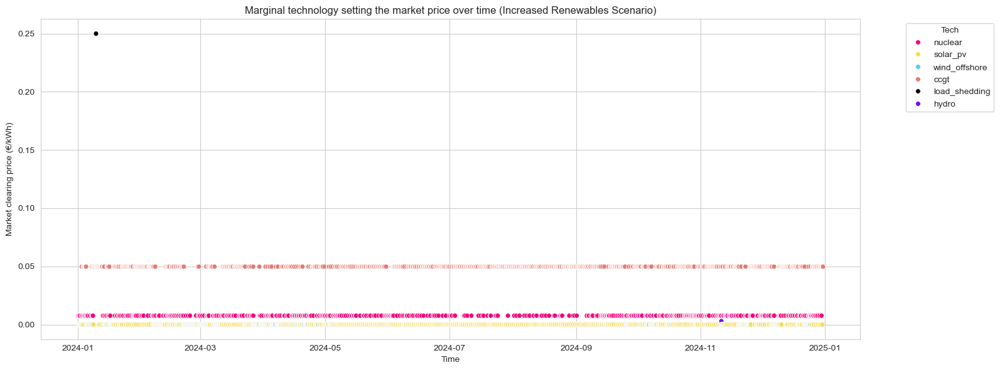

In [105]:
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(16, 6))

sns.scatterplot(
    data=marginal_tech_2,
    x='timesteps',
    y='marginal_generation_cost',
    hue='techs',
    palette=tech_colors,  
    s=30,  # marker size (larger than 18 for visibility)
    ax=ax
)

ax.set_xlabel("Time")
ax.set_ylabel("Market clearing price (€/kWh)")
ax.set_title("Marginal technology setting the market price over time (Increased Renewables Scenario)")
ax.legend(title="Tech", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

techs
solar_pv         3356
ccgt             3301
nuclear          1400
wind_offshore     698
load_shedding       4
hydro               1
Name: count, dtype: int64
techs
solar_pv         0.383105
ccgt             0.376826
nuclear          0.159817
wind_offshore    0.079680
load_shedding    0.000457
hydro            0.000114
Name: share, dtype: float64
[2025-12-15 15:49:54] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_27956\170569366.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



[2025-12-15 15:49:54] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_27956\170569366.py:24: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.




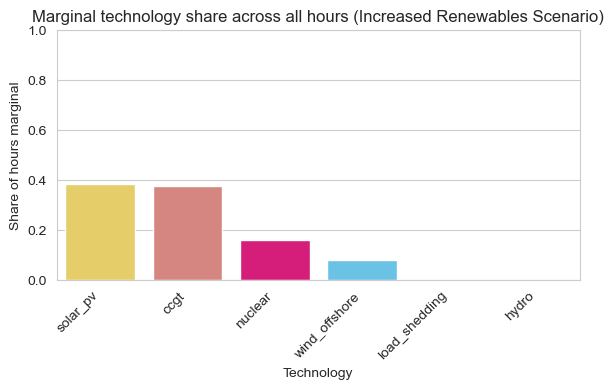

In [106]:
# Count how many hours each tech is marginal
freq = marginal_tech_2['techs'].value_counts().sort_values(ascending=False)
print(freq)
share = (freq / freq.sum()).rename('share')
print(share)

share_df = share.reset_index()
share_df.columns = ['techs', 'share']

fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=share_df,
    x='techs',
    y='share',
    palette=[tech_colors.get(tech, 'gray') for tech in share_df['techs']],
    ax=ax
)

ax.set_ylabel('Share of hours marginal')
ax.set_xlabel('Technology')
ax.set_ylim(0, 1)
ax.set_title('Marginal technology share across all hours (Increased Renewables Scenario)')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.show()

### 2.3. Dispatch per power plant type

In this example, we provide some pre-made plotting functionalities in the 'plotting_utilities.py' file, which you can import and apply as well as use as an example for making your own custom plots.

In [107]:
# Import some pre-made plotting functionalities as an example. You can use these, make your own, or simply
# create plots with your favourite Python library or non-Python tool, such as Excel
from plotting_utilities import plot_dispatch,plot_load_duration_curve

In [108]:
# Dispatch plots can be generated directly from the saved model results
plot_dispatch(model_path='results/more_vres.nc', plot_export_path='results/more_vres.html')

[2025-12-15 15:49:55] INFO     Model: preprocessing data (reentry)
[2025-12-15 15:49:55] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-15 15:49:55] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:49:55] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:49:55] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:49:55] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:49:55] INFO     Model: initialisation complete


### 2.4.  Load, residual load and price duration curves

In [109]:
gen_techs = ['solar_pv','wind_onshore', 'wind_offshore', 'hydro', 'ccgt', 'nuclear'] 

In [110]:
# For generating load duration curves (LDCs), instead, we first need to import back the model results,
# then extract the time-varing variable of interest
model_2 = calliope.read_netcdf('results/more_vres.nc')

[2025-12-15 15:49:56] INFO     Model: preprocessing data (reentry)
[2025-12-15 15:49:56] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-15 15:49:56] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:49:56] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:49:56] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:49:56] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:49:56] INFO     Model: initialisation complete


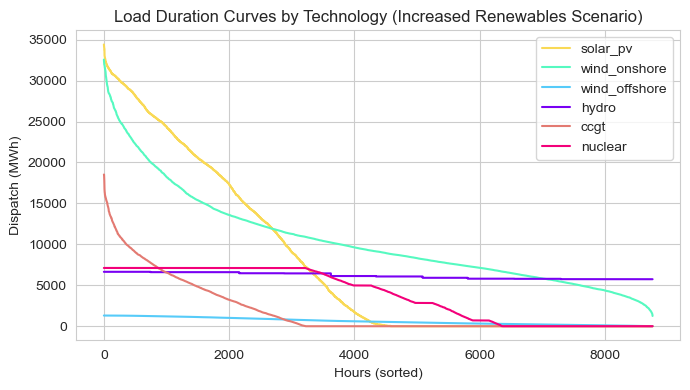

In [111]:
dispatch = {}
for tech in gen_techs:
    series = (
        model_2.results.flow_out
        .sel(techs=tech)        
        .to_series()
        .dropna()
        .sort_values(ascending=False)
        .reset_index(drop=True)
    )
    dispatch[tech] = series

# plot all LDCs for the different technologies
plt.figure(figsize=(7,4))

for tech, series in dispatch.items():
    plt.plot(series.values, label=tech, color=tech_colors.get(tech, 'black'))

plt.title("Load Duration Curves by Technology (Increased Renewables Scenario)")
plt.xlabel("Hours (sorted)")
plt.ylabel("Dispatch (MWh)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [112]:
# Or we may want the LDC of the shadow price, which we calculated earlier
plot_load_duration_curve(dataframe=balance_price_2['system_balance'].to_frame(), 
                         plot_export_path='results/more_vres_price.html', 
                         y_label='Price (EUR/kWh)')

In [113]:
# Obtain demand from input
demand_2 = model_2.inputs.sink_use_equals.sel(techs='demand_power').to_series().dropna()

# Get the dispatch of renewables
solar_pv_dispatch_2 = model_2.results.flow_out.sel(techs='solar_pv').to_series().dropna()
wind_onshore_dispatch_2 = model_2.results.flow_out.sel(techs='wind_onshore').to_series().dropna()
wind_offshore_dispatch_2 = model_2.results.flow_out.sel(techs='wind_offshore').to_series().dropna()

# Calculate the residual load (load minus renewable generation)
residual_load_2 = demand_2 - (solar_pv_dispatch_2 + wind_onshore_dispatch_2 + wind_offshore_dispatch_2)
residual_load_2.head()

timesteps            nodes  carriers
2024-01-01 00:00:00  NLD    power       12283.564587
2024-01-01 01:00:00  NLD    power       11929.840485
2024-01-01 02:00:00  NLD    power       11122.325411
2024-01-01 03:00:00  NLD    power       10392.195609
2024-01-01 04:00:00  NLD    power       10030.531002
dtype: float64

In [114]:
# Plot the LDC of the residual load
plot_load_duration_curve(dataframe=residual_load_2.to_frame(name='Residual Load (MWh)'),
                         plot_export_path='results/more_vres_residual_load.html',
                         y_label='Residual Load (MWh)')


### 2.5. CO2 emissions

In [115]:
# to get hourly generation for all techs, power carrier only
power_gen_2 = model_2.results.flow_out.sel(carriers="power")   # (nodes, techs, timesteps)

In [116]:
# emission factors (tCO2 per MWh of electricity)
emission_factors = {
    "ccgt": 0.42,   # only ccgt emits co2 emissions https://www.climatiq.io/data/emission-factor/7bfab478-b1e7-4ded-9907-9f200b40f2cb
}

In [117]:
# hourly emissions by tech (keep dict for possible future extra techs but this case only involves ccgt)
hourly_emissions_by_tech = {}
total_emissions_by_tech = {}

for tech, ef in emission_factors.items():
    # hourly generation for this tech (sum over nodes)
    gen_tech = power_gen_2.sel(techs=tech).sum(dim="nodes")      # (timesteps), MWh/h

    # hourly emissions (tCO2/h)
    emis_tech = gen_tech * ef                                  # DataArray over timesteps
    hourly_emissions_by_tech[tech] = emis_tech

    # total emissions over whole period
    total_emissions_by_tech[tech] = float(emis_tech.sum())     # tCO2


In [118]:
# Total across all emitting techs
total_emissions_t_2 = sum(total_emissions_by_tech.values())

print("CO2 emissions by tech:")
for tech, val in total_emissions_by_tech.items():
    print(f"  {tech}: {val:,.2f} tCO2")

print(f"\nTotal CO2 emissions: {total_emissions_t_2:,.2f} tCO2")
print(f"Total CO2 emissions: {total_emissions_t_2/1e6:.3f} MtCO2")

CO2 emissions by tech:
  ccgt: 6,915,204.43 tCO2

Total CO2 emissions: 6,915,204.43 tCO2
Total CO2 emissions: 6.915 MtCO2


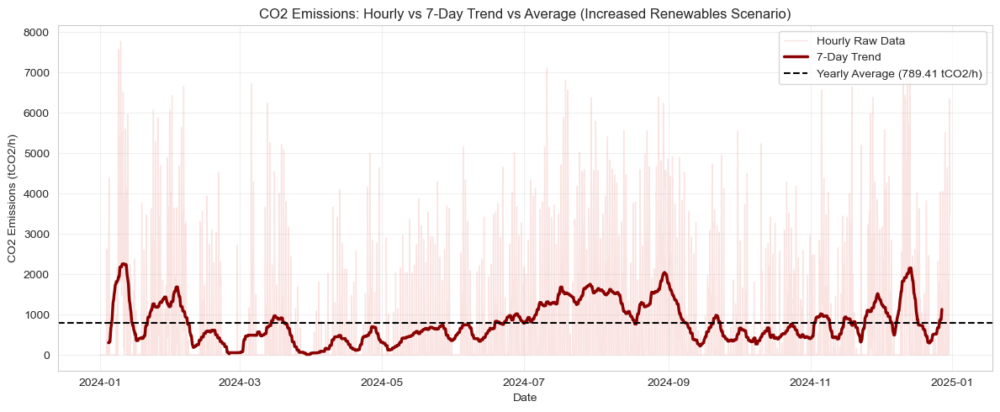

In [119]:
#plot
# convert to pandas Series with datetime index
ccgt_emissions = hourly_emissions_by_tech["ccgt"].to_series()
ccgt_emissions.index = pd.to_datetime(ccgt_emissions.index)

# 7-day rolling trend (168 hours)
trend_line = ccgt_emissions.rolling(window=168, center=True).mean()

# average over the whole period
average_val = ccgt_emissions.mean()

plt.figure(figsize=(12, 5))

# raw hourly data (faint)
plt.plot(
    ccgt_emissions.index,
    ccgt_emissions.values,
    color="#E37A72",
    alpha=0.2,
    linewidth=1,
    label="Hourly Raw Data",
)

# 7-day trend
plt.plot(
    trend_line.index,
    trend_line.values,
    color="darkred",
    linewidth=2.5,
    label="7-Day Trend",
)

# average line
plt.axhline(
    y=average_val,
    color="black",
    linestyle="--",
    linewidth=1.5,
    label=f"Yearly Average ({average_val:.2f} tCO2/h)",
)

plt.xlabel("Date")
plt.ylabel("CO2 Emissions (tCO2/h)")
plt.title("CO2 Emissions: Hourly vs 7-Day Trend vs Average (Increased Renewables Scenario)")
plt.legend(loc="upper right")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

### 2.6. Cost recovery

In [120]:
# Flow out for all gen techs in one go
dispatch_2 = (
    model_2.results.flow_out
    .sel(techs=gen_techs, carriers='power')   # carriers only if present
    .to_series()                              # -> Series with index (nodes, techs, timesteps)
    .unstack('techs')                         # techs become columns
    .reset_index()                            # timesteps as column, keep nodes
)

dispatch_2.head()


techs,nodes,timesteps,solar_pv,wind_onshore,wind_offshore,hydro,ccgt,nuclear
0,NLD,2024-01-01 00:00:00,0.0,8570.138480,1009.713600,6645.575037,0.000126,5637.990097
1,NLD,2024-01-01 01:00:00,0.0,8243.438625,1027.387557,6645.575037,0.000126,5284.265995
2,NLD,2024-01-01 02:00:00,0.0,7927.889315,982.868607,6645.575037,0.000126,4476.750922
3,NLD,2024-01-01 03:00:00,0.0,7584.111715,891.359343,6645.575037,0.000126,3746.621119
4,NLD,2024-01-01 04:00:00,0.0,7282.935865,823.699800,6645.575037,0.000126,3384.956512


In [121]:
# Shadow price dataframe
balance_price_2 = (
    model_2.results.shadow_price_system_balance
    .to_series().reset_index()
)
balance_price_2

# Merge price into dispatch
df_2 = balance_price_2.merge(dispatch_2, on='timesteps', how='left')
df_2.head()

,nodes_x,carriers,timesteps,shadow_price_system_balance,nodes_y,solar_pv,wind_onshore,wind_offshore,hydro,ccgt,nuclear
0,NLD,power,2024-01-01 00:00:00,0.007627,NLD,0.0,8570.138480,1009.713600,6645.575037,0.000126,5637.990097
1,NLD,power,2024-01-01 01:00:00,0.007627,NLD,0.0,8243.438625,1027.387557,6645.575037,0.000126,5284.265995
2,NLD,power,2024-01-01 02:00:00,0.007627,NLD,0.0,7927.889315,982.868607,6645.575037,0.000126,4476.750922
3,NLD,power,2024-01-01 03:00:00,0.007627,NLD,0.0,7584.111715,891.359343,6645.575037,0.000126,3746.621119
4,NLD,power,2024-01-01 04:00:00,0.007627,NLD,0.0,7282.935865,823.699800,6645.575037,0.000126,3384.956512


In [122]:
# Revenue per tech = price * dispatch (hourly)
for tech in gen_techs:
    df_2[f'{tech}_revenue'] = df_2[tech] * df_2['shadow_price_system_balance']

# Total (modelled-period) revenue per tech
revenue_2 = df_2[[f'{t}_revenue' for t in gen_techs]].sum()
revenue_2.index = revenue_2.index.str.replace('_revenue', '', regex=False)
revenue_2.name = 'revenue'
revenue_2

solar_pv         1.767800e+05
wind_onshore     1.469448e+06
wind_offshore    8.552774e+04
hydro            1.094017e+06
ccgt             8.342605e+05
nuclear          1.232325e+06
Name: revenue, dtype: float64

In [123]:
cost_2 = (
    model_2.results.cost
    .sel(techs=gen_techs)   # we only care about these
    .sum('nodes')           # if you only have one node, this just drops the dim
    .to_series()
)
cost_2 = cost_2.droplevel('costs')                # or just drop the level
cost_2.name = 'cost'
cost_2


techs
solar_pv            716.837319
wind_onshore     139005.314150
wind_offshore       113.764079
hydro            161954.945069
ccgt             819425.728101
nuclear          258780.112740
Name: cost, dtype: float64

In [124]:
# calculate profit and cost recovery ratio
covery_2 = pd.concat([revenue_2, cost_2], axis=1)
covery_2['profit'] = covery_2['revenue'] - covery_2['cost'] # >0 means revenue covers cost
covery_2['cost_recovery_ratio'] = covery_2['revenue'] / covery_2['cost']  # >1 means full recovery
covery_2

,revenue,cost,profit,cost_recovery_ratio
solar_pv,1.767800e+05,716.837319,1.760632e+05,246.611031
wind_onshore,1.469448e+06,139005.314150,1.330443e+06,10.571167
wind_offshore,8.552774e+04,113.764079,8.541398e+04,751.799186
hydro,1.094017e+06,161954.945069,9.320618e+05,6.755069
ccgt,8.342605e+05,819425.728101,1.483472e+04,1.018104
nuclear,1.232325e+06,258780.112740,9.735446e+05,4.762053


In [125]:
covery_df_2 = covery_2.reset_index()
covery_df_2.columns = ['techs', 'revenue', 'cost', 'profit', 'cost_recovery_ratio']
covery_df_2

,techs,revenue,cost,profit,cost_recovery_ratio
0,solar_pv,1.767800e+05,716.837319,1.760632e+05,246.611031
1,wind_onshore,1.469448e+06,139005.314150,1.330443e+06,10.571167
2,wind_offshore,8.552774e+04,113.764079,8.541398e+04,751.799186
3,hydro,1.094017e+06,161954.945069,9.320618e+05,6.755069
4,ccgt,8.342605e+05,819425.728101,1.483472e+04,1.018104
5,nuclear,1.232325e+06,258780.112740,9.735446e+05,4.762053


[2025-12-15 15:49:57] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_27956\562993365.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



[2025-12-15 15:49:57] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_27956\562993365.py:16: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.




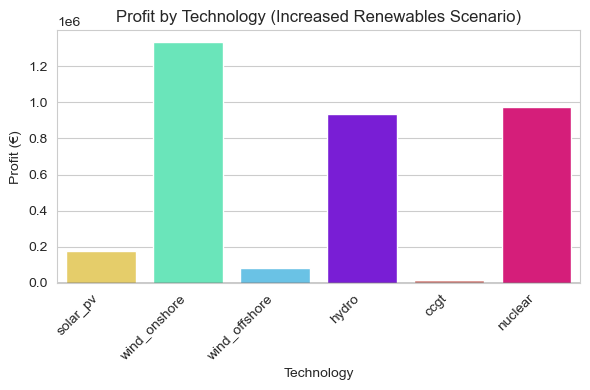

[2025-12-15 15:49:57] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_27956\562993365.py:24: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.





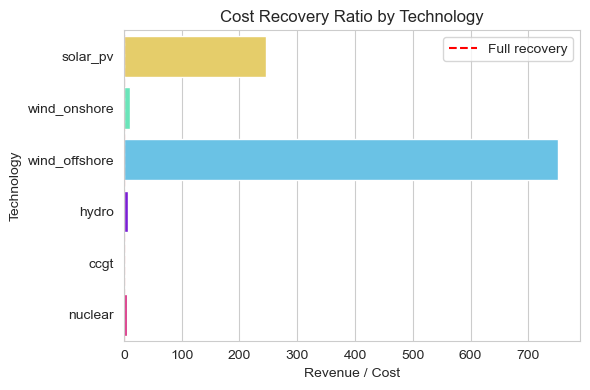

In [126]:
# --- FIGURE 1: PROFIT ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df_2,
    x="techs",
    y="profit",
    palette=tech_colors,   # use tech-specific colors
    ax=ax
)

ax.axhline(0, color="black", linewidth=1)
ax.set_title("Profit by Technology (Increased Renewables Scenario)")
ax.set_ylabel("Profit (€)")
ax.set_xlabel("Technology")
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

plt.tight_layout()
plt.show()

# --- FIGURE 2: COST RECOVERY RATIO ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df_2,
    y="techs",
    x="cost_recovery_ratio",
    palette=tech_colors,   # same colors, consistent across figures
    ax=ax
)

ax.axvline(1.0, color="red", linestyle="--", linewidth=1.5, label="Full recovery")
ax.set_title("Cost Recovery Ratio by Technology")
ax.set_xlabel("Revenue / Cost")
ax.set_ylabel("Technology")
ax.legend()

plt.tight_layout()
plt.show()

# 3. Nuclear phase out
### 3.1 Reload the model with a scenario that forces a lower capacity of nuclear

In [127]:
model_3 = calliope.read_yaml('model/model.yaml',scenario='less_nuclear')

[2025-12-15 15:49:57] INFO     Loading overrides from scenario: less_nuclear 
[2025-12-15 15:49:57] INFO     (scenarios, less_nuclear ) | Applying the following overrides: ['lower_nuclear'].
[2025-12-15 15:49:57] INFO     Math init | loading pre-defined math.
[2025-12-15 15:49:57] INFO     Math init | loading math files {'milp', 'base', 'spores', 'storage_inter_cluster', 'operate'}.
[2025-12-15 15:49:57] INFO     Model: preprocessing data
[2025-12-15 15:49:57] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-15 15:49:58] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:49:58] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:49:58] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:49:58] INFO     input data `name` not defined in model mat

In [128]:
model_3.build()
model_3.solve()

[2025-12-15 15:49:58] INFO     Model: backend build starting
[2025-12-15 15:49:59] INFO     Optimisation Model | parameters/lookups | Generated.
[2025-12-15 15:50:00] INFO     Optimisation Model | variables | Generated.
[2025-12-15 15:50:01] INFO     Optimisation Model | global_expressions | Generated.
[2025-12-15 15:50:07] INFO     Optimisation Model | constraints | Generated.
[2025-12-15 15:50:07] INFO     Optimisation Model | piecewise_constraints | Generated.
[2025-12-15 15:50:07] INFO     Optimisation Model | objectives | Generated.
[2025-12-15 15:50:07] INFO     Model: backend build complete
[2025-12-15 15:50:12] INFO     Optimisation model | starting model in base mode.
[2025-12-15 15:50:18] DEBUG    Read LP format model from file C:\Users\yaowa\AppData\Local\Temp\tmpmxlzr0ui.pyomo.lp
Reading time = 0.64 seconds
x1: 227753 rows, 140160 columns, 411707 nonzeros
Set parameter QCPDual to value 1
Set parameter Threads to value 6
Set parameter Method to value 2
Set parameter Crossove

In [129]:
model_3.to_netcdf('results/less_nuclear.nc')

### 3.2. Marginal technology

In [130]:
# Shadow price for the power system balance constraint
balance_price_3 = model_3.backend.shadow_prices.get("system_balance").to_series().reset_index()
balance_price_3.head()

,nodes,carriers,timesteps,system_balance
0,NLD,power,2024-01-01 00:00:00,0.007627
1,NLD,power,2024-01-01 01:00:00,0.007627
2,NLD,power,2024-01-01 02:00:00,0.007627
3,NLD,power,2024-01-01 03:00:00,0.007627
4,NLD,power,2024-01-01 04:00:00,0.007627


<Axes: >

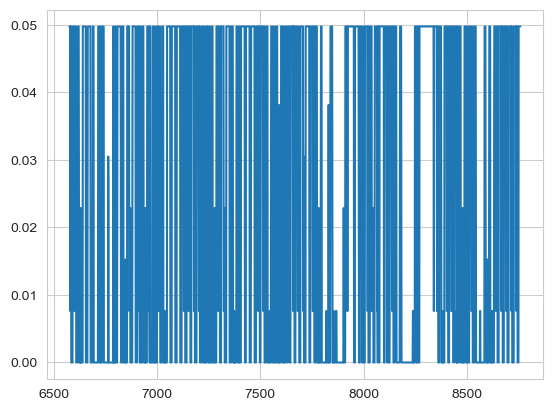

In [131]:
# Create a Date Range to select October to inspect visually
days_of_interest = pd.date_range('2024-10-01','2024-12-31',freq='h') 
# Plot the days of interest
balance_price_3['system_balance'].loc[balance_price_3['timesteps'].isin(days_of_interest)].plot()

We need to determine which technology's marginal cost serves as the shadow price for market balancing.

In [132]:
variable_costs_3 = model_3.results.cost_operation_variable.to_series().dropna()
generation_3 = model_3.results.flow_out.to_series().dropna()
# hour and the marginal cost of the marginal generator in the merit order
marginal_generation_costs_3 = variable_costs_3/generation_3

# tranform to a DataFrame
marginal_generation_costs_3 = marginal_generation_costs_3.reset_index()

# change column name '0' to 'marginal_generation_cost'
marginal_generation_costs_3 = marginal_generation_costs_3.rename(columns={0: 'marginal_generation_cost'})
marginal_generation_costs_3.head()

,nodes,techs,costs,timesteps,carriers,marginal_generation_cost
0,NLD,ccgt,monetary,2024-01-01 00:00:00,power,0.049768
1,NLD,ccgt,monetary,2024-01-01 01:00:00,power,0.049768
2,NLD,ccgt,monetary,2024-01-01 02:00:00,power,0.049768
3,NLD,ccgt,monetary,2024-01-01 03:00:00,power,0.049768
4,NLD,ccgt,monetary,2024-01-01 04:00:00,power,0.049768


In [133]:
# Merge marginal generation costs with balance price
merged_3 = marginal_generation_costs_3.merge(
    balance_price_3,
    on=['nodes', 'carriers', 'timesteps'],
    how='inner'
)
merged_3.head()

,nodes,techs,costs,timesteps,carriers,marginal_generation_cost,system_balance
0,NLD,ccgt,monetary,2024-01-01 00:00:00,power,0.049768,0.007627
1,NLD,ccgt,monetary,2024-01-01 01:00:00,power,0.049768,0.007627
2,NLD,ccgt,monetary,2024-01-01 02:00:00,power,0.049768,0.007627
3,NLD,ccgt,monetary,2024-01-01 03:00:00,power,0.049768,0.007627
4,NLD,ccgt,monetary,2024-01-01 04:00:00,power,0.049768,0.007627


In [134]:
merged_3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61320 entries, 0 to 61319
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     61320 non-null  object        
 1   techs                     61320 non-null  object        
 2   costs                     61320 non-null  object        
 3   timesteps                 61320 non-null  datetime64[ns]
 4   carriers                  61320 non-null  object        
 5   marginal_generation_cost  44190 non-null  float64       
 6   system_balance            61320 non-null  object        
dtypes: datetime64[ns](1), float64(1), object(5)
memory usage: 3.3+ MB


In [135]:
# turn system_balance and marginal_generation_cost into float type
merged_3['system_balance'] = merged_3['system_balance'].astype(float)
merged_3['marginal_generation_cost'] = merged_3['marginal_generation_cost'].astype(float)
merged_3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61320 entries, 0 to 61319
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     61320 non-null  object        
 1   techs                     61320 non-null  object        
 2   costs                     61320 non-null  object        
 3   timesteps                 61320 non-null  datetime64[ns]
 4   carriers                  61320 non-null  object        
 5   marginal_generation_cost  44190 non-null  float64       
 6   system_balance            61320 non-null  float64       
dtypes: datetime64[ns](1), float64(2), object(4)
memory usage: 3.3+ MB


In [136]:
# Compute absolute difference between marginal cost and price
merged_3['diff'] = (merged_3['marginal_generation_cost'] - merged_3['system_balance']).abs()

# Show the technology with the smallest difference for each timestep and node
marginal_tech_3 = (
    merged_3.sort_values('diff')
          .groupby(['timesteps', 'nodes'], as_index=False)
          .first()[['timesteps', 'nodes', 'techs',
                    'marginal_generation_cost', 'system_balance', 'diff']]
)
marginal_tech_3.head()


,timesteps,nodes,techs,marginal_generation_cost,system_balance,diff
0,2024-01-01 00:00:00,NLD,nuclear,0.007627,0.007627,1.256889e-07
1,2024-01-01 01:00:00,NLD,nuclear,0.007627,0.007627,3.438864e-09
2,2024-01-01 02:00:00,NLD,nuclear,0.007627,0.007627,1.250322e-10
3,2024-01-01 03:00:00,NLD,nuclear,0.007627,0.007627,1.343279e-09
4,2024-01-01 04:00:00,NLD,nuclear,0.007627,0.007627,7.034296e-10


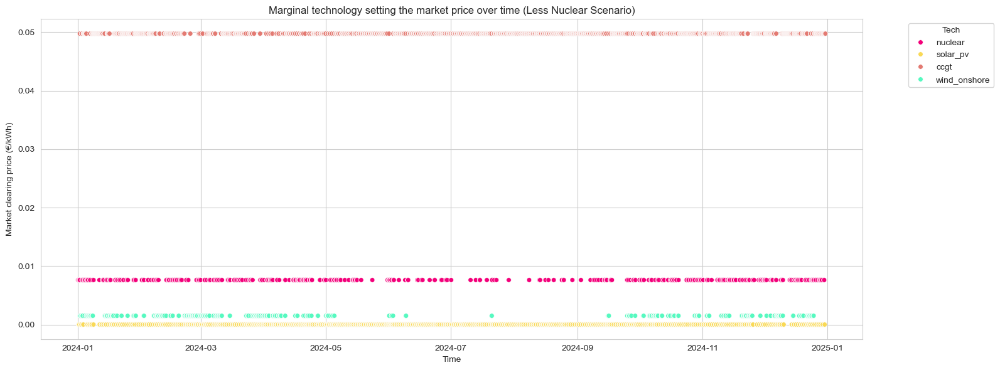

In [137]:
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(16, 6))

sns.scatterplot(
    data=marginal_tech_3,
    x='timesteps',
    y='marginal_generation_cost',
    hue='techs',
    palette=tech_colors,  
    s=30,  # marker size (larger than 18 for visibility)
    ax=ax
)

ax.set_xlabel("Time")
ax.set_ylabel("Market clearing price (€/kWh)")
ax.set_title("Marginal technology setting the market price over time (Less Nuclear Scenario)")
ax.legend(title="Tech", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

techs
ccgt            3939
solar_pv        3291
wind_onshore     851
nuclear          679
Name: count, dtype: int64
techs
ccgt            0.449658
solar_pv        0.375685
wind_onshore    0.097146
nuclear         0.077511
Name: share, dtype: float64
[2025-12-15 15:50:25] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_27956\2573863667.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



[2025-12-15 15:50:25] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_27956\2573863667.py:24: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.




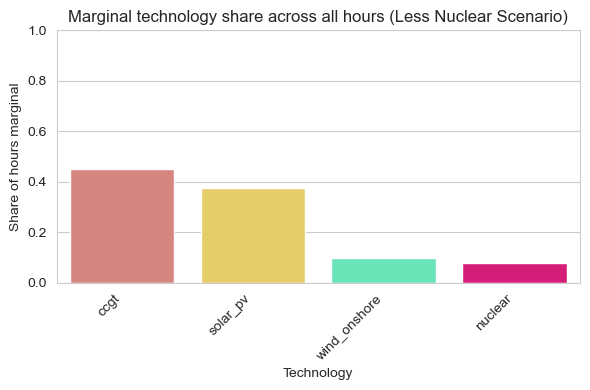

In [138]:
# Count how many hours each tech is marginal
freq = marginal_tech_3['techs'].value_counts().sort_values(ascending=False)
print(freq)
share = (freq / freq.sum()).rename('share')
print(share)

share_df = share.reset_index()
share_df.columns = ['techs', 'share']

fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=share_df,
    x='techs',
    y='share',
    palette=[tech_colors.get(tech, 'gray') for tech in share_df['techs']],
    ax=ax
)

ax.set_ylabel('Share of hours marginal')
ax.set_xlabel('Technology')
ax.set_ylim(0, 1)
ax.set_title('Marginal technology share across all hours (Less Nuclear Scenario)')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.show()

### 3.3. Dispatch per power plant type

In this example, we provide some pre-made plotting functionalities in the 'plotting_utilities.py' file, which you can import and apply as well as use as an example for making your own custom plots.

In [139]:
# Import some pre-made plotting functionalities as an example. You can use these, make your own, or simply
# create plots with your favourite Python library or non-Python tool, such as Excel
from plotting_utilities import plot_dispatch,plot_load_duration_curve

In [140]:
# Dispatch plots can be generated directly from the saved model results
plot_dispatch(model_path='results/less_nuclear.nc', plot_export_path='results/less_nuclear_dispatch.html')

[2025-12-15 15:50:25] INFO     Model: preprocessing data (reentry)
[2025-12-15 15:50:25] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-15 15:50:25] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:50:25] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:50:25] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:50:25] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:50:25] INFO     Model: initialisation complete


### 3.4.  Load, residual load and price duration curves

In [141]:
gen_techs = ['solar_pv','wind_onshore', 'hydro', 'ccgt', 'nuclear'] 

In [142]:
# For generating load duration curves (LDCs), instead, we first need to import back the model results,
# then extract the time-varing variable of interest
model_3 = calliope.read_netcdf('results/less_nuclear.nc')

[2025-12-15 15:50:26] INFO     Model: preprocessing data (reentry)
[2025-12-15 15:50:26] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-15 15:50:26] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:50:26] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:50:26] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:50:26] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:50:26] INFO     Model: initialisation complete


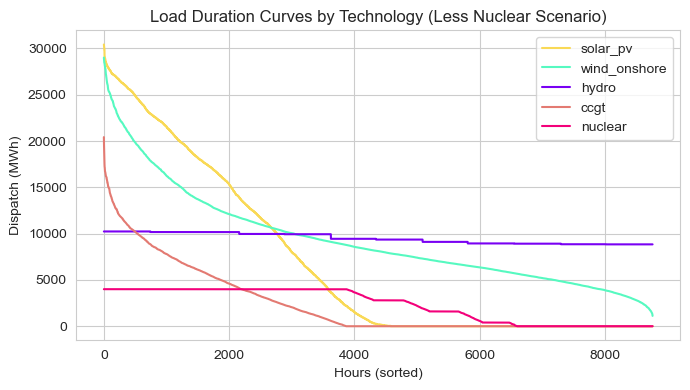

In [143]:
dispatch = {}
for tech in gen_techs:
    series = (
        model_3.results.flow_out
        .sel(techs=tech)        
        .to_series()
        .dropna()
        .sort_values(ascending=False)
        .reset_index(drop=True)
    )
    dispatch[tech] = series

# plot all LDCs for the different technologies
plt.figure(figsize=(7,4))

for tech, series in dispatch.items():
    plt.plot(series.values, label=tech, color=tech_colors.get(tech, 'black'))

plt.title("Load Duration Curves by Technology (Less Nuclear Scenario)")
plt.xlabel("Hours (sorted)")
plt.ylabel("Dispatch (MWh)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [144]:
# Or we may want the LDC of the shadow price, which we calculated earlier
plot_load_duration_curve(dataframe=balance_price_3['system_balance'].to_frame(), 
                         plot_export_path='results/less_nuclear_price.html', 
                         y_label='Price (EUR/kWh)')

In [145]:
# Obtain demand from input
demand_3 = model_3.inputs.sink_use_equals.sel(techs='demand_power').to_series().dropna()

# Get the dispatch of renewables
solar_pv_dispatch = model_3.results.flow_out.sel(techs='solar_pv').to_series().dropna()
wind_onshore_dispatch = model_3.results.flow_out.sel(techs='wind_onshore').to_series().dropna()
# Calculate the residual load (load minus renewable generation)
residual_load_3 = demand_3 - (solar_pv_dispatch + wind_onshore_dispatch)
residual_load_3.head()

timesteps            nodes  carriers
2024-01-01 00:00:00  NLD    power       14227.213915
2024-01-01 01:00:00  NLD    power       13855.561467
2024-01-01 02:00:00  NLD    power       12969.140277
2024-01-01 03:00:00  NLD    power       12110.037851
2024-01-01 04:00:00  NLD    power       11647.892891
dtype: float64

In [146]:
# Plot the LDC of the residual load
plot_load_duration_curve(dataframe=residual_load_3.to_frame(name='Residual Load (MWh)'),
                         plot_export_path='results/less_nuclear_residual_load.html',
                         y_label='Residual Load (MWh)')


### 3.5. CO2 emissions

In [147]:
# to get hourly generation for all techs, power carrier only
power_gen_3 = model_3.results.flow_out.sel(carriers="power")   # (nodes, techs, timesteps)

In [148]:
# emission factors (tCO2 per MWh of electricity)
emission_factors = {
    "ccgt": 0.42,   # only ccgt emits co2 emissions https://www.climatiq.io/data/emission-factor/7bfab478-b1e7-4ded-9907-9f200b40f2cb
}

In [149]:
# hourly emissions by tech (keep dict for possible future extra techs but this case only involves ccgt)
hourly_emissions_by_tech = {}
total_emissions_by_tech = {}

for tech, ef in emission_factors.items():
    # hourly generation for this tech (sum over nodes)
    gen_tech = power_gen_3.sel(techs=tech).sum(dim="nodes")      # (timesteps), MWh/h

    # hourly emissions (tCO2/h)
    emis_tech = gen_tech * ef                                  # DataArray over timesteps
    hourly_emissions_by_tech[tech] = emis_tech

    # total emissions over whole period
    total_emissions_by_tech[tech] = float(emis_tech.sum())     # tCO2


In [150]:
# Total across all emitting techs
total_emissions_t_3 = sum(total_emissions_by_tech.values())

print("CO2 emissions by tech:")
for tech, val in total_emissions_by_tech.items():
    print(f"  {tech}: {val:,.2f} tCO2")

print(f"\nTotal CO2 emissions: {total_emissions_t_3:,.2f} tCO2")
print(f"Total CO2 emissions: {total_emissions_t_3/1e6:.3f} MtCO2")

CO2 emissions by tech:
  ccgt: 8,832,685.25 tCO2

Total CO2 emissions: 8,832,685.25 tCO2
Total CO2 emissions: 8.833 MtCO2


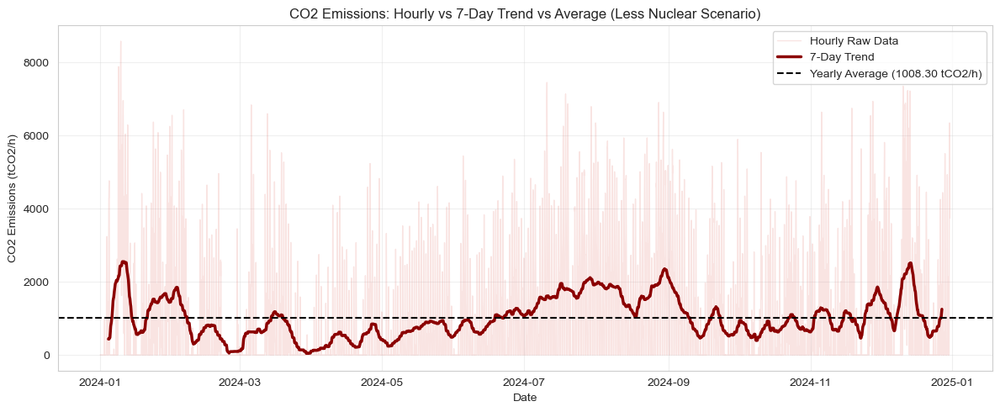

In [151]:
#plot
# convert to pandas Series with datetime index
ccgt_emissions = hourly_emissions_by_tech["ccgt"].to_series()
ccgt_emissions.index = pd.to_datetime(ccgt_emissions.index)

# 7-day rolling trend (168 hours)
trend_line = ccgt_emissions.rolling(window=168, center=True).mean()

# average over the whole period
average_val = ccgt_emissions.mean()

plt.figure(figsize=(12, 5))

# raw hourly data (faint)
plt.plot(
    ccgt_emissions.index,
    ccgt_emissions.values,
    color="#E37A72",
    alpha=0.2,
    linewidth=1,
    label="Hourly Raw Data",
)

# 7-day trend
plt.plot(
    trend_line.index,
    trend_line.values,
    color="darkred",
    linewidth=2.5,
    label="7-Day Trend",
)

# average line
plt.axhline(
    y=average_val,
    color="black",
    linestyle="--",
    linewidth=1.5,
    label=f"Yearly Average ({average_val:.2f} tCO2/h)",
)

plt.xlabel("Date")
plt.ylabel("CO2 Emissions (tCO2/h)")
plt.title("CO2 Emissions: Hourly vs 7-Day Trend vs Average (Less Nuclear Scenario)")
plt.legend(loc="upper right")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

### 3.6. Cost recovery

In [152]:
# Flow out for all gen techs in one go
dispatch_3 = (
    model_3.results.flow_out
    .sel(techs=gen_techs, carriers='power')   # carriers only if present
    .to_series()                              # -> Series with index (nodes, techs, timesteps)
    .unstack('techs')                         # techs become columns
    .reset_index()                            # timesteps as column, keep nodes
)

dispatch_3.head()


techs,nodes,timesteps,solar_pv,wind_onshore,hydro,ccgt,nuclear
0,NLD,2024-01-01 00:00:00,0.0,7636.202752,10233.511024,0.000018,3993.702963
1,NLD,2024-01-01 01:00:00,0.0,7345.105200,10233.511024,0.000018,3622.050519
2,NLD,2024-01-01 02:00:00,0.0,7063.943056,10233.511024,0.000018,2735.629329
3,NLD,2024-01-01 03:00:00,0.0,6757.628816,10233.511024,0.000018,1876.526903
4,NLD,2024-01-01 04:00:00,0.0,6489.273776,10233.511024,0.000018,1414.381943


In [153]:
# Shadow price dataframe
balance_price_3 = (
    model_3.results.shadow_price_system_balance
    .to_series().reset_index()
)

# Merge price into dispatch
df = balance_price_3.merge(dispatch_3, on='timesteps', how='left')
df.head()

,nodes_x,carriers,timesteps,shadow_price_system_balance,nodes_y,solar_pv,wind_onshore,hydro,ccgt,nuclear
0,NLD,power,2024-01-01 00:00:00,0.007627,NLD,0.0,7636.202752,10233.511024,0.000018,3993.702963
1,NLD,power,2024-01-01 01:00:00,0.007627,NLD,0.0,7345.105200,10233.511024,0.000018,3622.050519
2,NLD,power,2024-01-01 02:00:00,0.007627,NLD,0.0,7063.943056,10233.511024,0.000018,2735.629329
3,NLD,power,2024-01-01 03:00:00,0.007627,NLD,0.0,6757.628816,10233.511024,0.000018,1876.526903
4,NLD,power,2024-01-01 04:00:00,0.007627,NLD,0.0,6489.273776,10233.511024,0.000018,1414.381943


In [154]:
# Revenue per tech = price * dispatch (hourly)
for tech in gen_techs:
    df[f'{tech}_revenue'] = df[tech] * df['shadow_price_system_balance']

# Total (modelled-period) revenue per tech
revenue = df[[f'{t}_revenue' for t in gen_techs]].sum()
revenue.index = revenue.index.str.replace('_revenue', '', regex=False)
revenue.name = 'revenue'
revenue

solar_pv        2.221254e+05
wind_onshore    1.535416e+06
hydro           1.913978e+06
ccgt            1.046640e+06
nuclear         8.008907e+05
Name: revenue, dtype: float64

In [155]:
cost_3 = (
    model_3.results.cost
    .sel(techs=gen_techs)   # we only care about these
    .sum('nodes')           # if you only have one node, this just drops the dim
    .to_series()
)
cost_3 = cost_3.droplevel('costs')                # or just drop the level
cost_3.name = 'cost'
cost_3


techs
solar_pv        6.338467e+02
wind_onshore    1.238571e+05
hydro           2.493942e+05
ccgt            1.046640e+06
nuclear         1.567726e+05
Name: cost, dtype: float64

In [156]:
# calculate profit and cost recovery ratio
covery_3 = pd.concat([revenue, cost_3], axis=1)
covery_3['profit'] = covery_3['revenue'] - covery_3['cost'] # >0 means revenue covers cost
covery_3['cost_recovery_ratio'] = covery_3['revenue'] / covery_3['cost']  # >1 means full recovery
covery_3

,revenue,cost,profit,cost_recovery_ratio
solar_pv,2.221254e+05,6.338467e+02,2.214916e+05,350.440310
wind_onshore,1.535416e+06,1.238571e+05,1.411559e+06,12.396669
hydro,1.913978e+06,2.493942e+05,1.664584e+06,7.674509
ccgt,1.046640e+06,1.046640e+06,-5.448891e-03,1.000000
nuclear,8.008907e+05,1.567726e+05,6.441181e+05,5.108615


In [157]:
covery_df_3 = covery_3.reset_index()
covery_df_3.columns = ['techs', 'revenue', 'cost', 'profit', 'cost_recovery_ratio']
covery_df_3

,techs,revenue,cost,profit,cost_recovery_ratio
0,solar_pv,2.221254e+05,6.338467e+02,2.214916e+05,350.440310
1,wind_onshore,1.535416e+06,1.238571e+05,1.411559e+06,12.396669
2,hydro,1.913978e+06,2.493942e+05,1.664584e+06,7.674509
3,ccgt,1.046640e+06,1.046640e+06,-5.448891e-03,1.000000
4,nuclear,8.008907e+05,1.567726e+05,6.441181e+05,5.108615


[2025-12-15 15:50:27] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_27956\1941397725.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.





[2025-12-15 15:50:27] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_27956\1941397725.py:16: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.




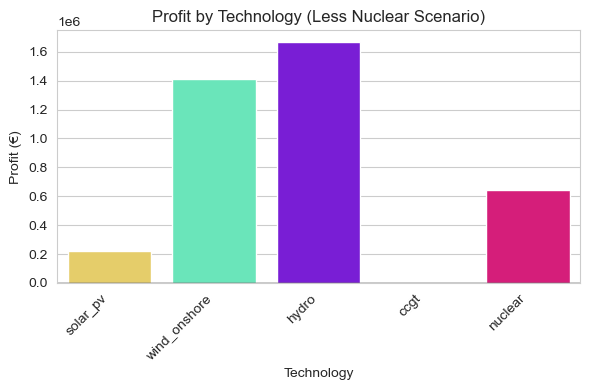

[2025-12-15 15:50:27] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_27956\1941397725.py:24: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.





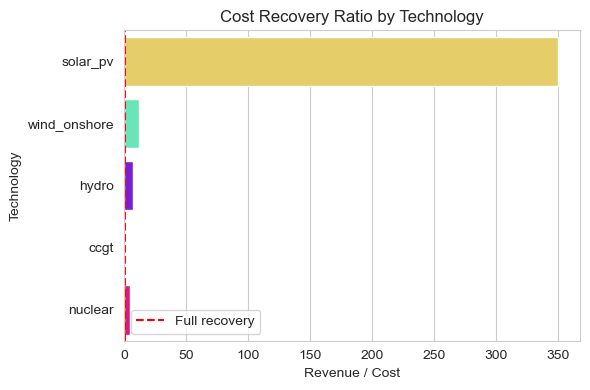

In [158]:
# --- FIGURE 1: PROFIT ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df_3,
    x="techs",
    y="profit",
    palette=tech_colors,   # use tech-specific colors
    ax=ax
)

ax.axhline(0, color="black", linewidth=1)
ax.set_title("Profit by Technology (Less Nuclear Scenario)")
ax.set_ylabel("Profit (€)")
ax.set_xlabel("Technology")
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

plt.tight_layout()
plt.show()

# --- FIGURE 2: COST RECOVERY RATIO ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df_3,
    y="techs",
    x="cost_recovery_ratio",
    palette=tech_colors,   # same colors, consistent across figures
    ax=ax
)

ax.axvline(1.0, color="red", linestyle="--", linewidth=1.5, label="Full recovery")
ax.set_title("Cost Recovery Ratio by Technology")
ax.set_xlabel("Revenue / Cost")
ax.set_ylabel("Technology")
ax.legend()

plt.tight_layout()
plt.show()

# 4. Combine increasing renewables and nuclear phase out
### 4.1 Reload the model with a scenario that forces a higher renewables and lower capacity of nuclear

In [159]:
model_4 = calliope.read_yaml('model/model.yaml',scenario='combination')

[2025-12-15 15:50:27] INFO     Loading overrides from scenario: combination 
[2025-12-15 15:50:27] INFO     (scenarios, combination ) | Applying the following overrides: ['lower_nuclear', 'higher_renewables'].


[2025-12-15 15:50:27] INFO     Math init | loading pre-defined math.
[2025-12-15 15:50:27] INFO     Math init | loading math files {'milp', 'base', 'spores', 'storage_inter_cluster', 'operate'}.
[2025-12-15 15:50:28] INFO     Model: preprocessing data
[2025-12-15 15:50:28] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-15 15:50:28] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:50:28] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:50:28] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:50:28] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:50:28] INFO     Model: initialisation complete


In [160]:
model_4.build()
model_4.solve()

[2025-12-15 15:50:28] INFO     Model: backend build starting
[2025-12-15 15:50:29] INFO     Optimisation Model | parameters/lookups | Generated.
[2025-12-15 15:50:29] INFO     Optimisation Model | variables | Generated.
[2025-12-15 15:50:31] INFO     Optimisation Model | global_expressions | Generated.
[2025-12-15 15:50:37] INFO     Optimisation Model | constraints | Generated.
[2025-12-15 15:50:37] INFO     Optimisation Model | piecewise_constraints | Generated.
[2025-12-15 15:50:37] INFO     Optimisation Model | objectives | Generated.
[2025-12-15 15:50:37] INFO     Model: backend build complete
[2025-12-15 15:50:42] INFO     Optimisation model | starting model in base mode.
[2025-12-15 15:50:49] DEBUG    Read LP format model from file C:\Users\yaowa\AppData\Local\Temp\tmpv5rfwawe.pyomo.lp
Reading time = 0.51 seconds
x1: 227753 rows, 140160 columns, 411707 nonzeros
Set parameter QCPDual to value 1
Set parameter Threads to value 6
Set parameter Method to value 2
Set parameter Crossove

In [161]:
model_4.to_netcdf('results/combination.nc')

### 4.2. Marginal technology

In [162]:
# Shadow price for the power system balance constraint
balance_price_4 = model_4.backend.shadow_prices.get("system_balance").to_series().reset_index()
balance_price_4.head()

,nodes,carriers,timesteps,system_balance
0,NLD,power,2024-01-01 00:00:00,0.049768
1,NLD,power,2024-01-01 01:00:00,0.049768
2,NLD,power,2024-01-01 02:00:00,0.049768
3,NLD,power,2024-01-01 03:00:00,0.007627
4,NLD,power,2024-01-01 04:00:00,0.007627


<Axes: >

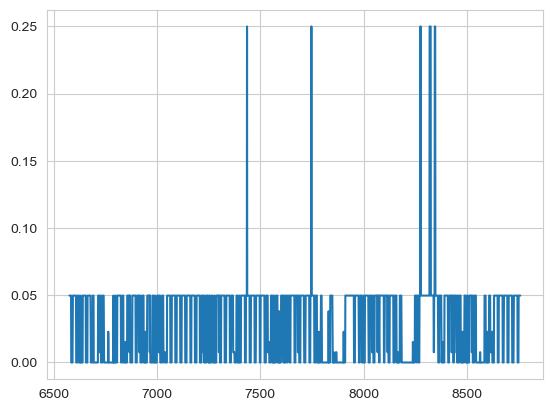

In [163]:
# Create a Date Range to select October to inspect visually
days_of_interest = pd.date_range('2024-10-01','2024-12-31',freq='h') 
# Plot the days of interest
balance_price_4['system_balance'].loc[balance_price_4['timesteps'].isin(days_of_interest)].plot()

We need to determine which technology's marginal cost serves as the shadow price for market balancing.

In [164]:
variable_costs_4 = model_4.results.cost_operation_variable.to_series().dropna()
generation_4 = model_4.results.flow_out.to_series().dropna()
# hour and the marginal cost of the marginal generator in the merit order
marginal_generation_costs_4 = variable_costs_4/generation_4

# tranform to a DataFrame
marginal_generation_costs_4 = marginal_generation_costs_4.reset_index()

# change column name '0' to 'marginal_generation_cost'
marginal_generation_costs_4 = marginal_generation_costs_4.rename(columns={0: 'marginal_generation_cost'})
marginal_generation_costs_4.head()

,nodes,techs,costs,timesteps,carriers,marginal_generation_cost
0,NLD,ccgt,monetary,2024-01-01 00:00:00,power,0.049768
1,NLD,ccgt,monetary,2024-01-01 01:00:00,power,0.049768
2,NLD,ccgt,monetary,2024-01-01 02:00:00,power,0.049768
3,NLD,ccgt,monetary,2024-01-01 03:00:00,power,0.049768
4,NLD,ccgt,monetary,2024-01-01 04:00:00,power,0.049768


In [165]:
# Merge marginal generation costs with balance price
merged_4 = marginal_generation_costs_4.merge(
    balance_price_4,
    on=['nodes', 'carriers', 'timesteps'],
    how='inner'
)
merged_4.head()

,nodes,techs,costs,timesteps,carriers,marginal_generation_cost,system_balance
0,NLD,ccgt,monetary,2024-01-01 00:00:00,power,0.049768,0.049768
1,NLD,ccgt,monetary,2024-01-01 01:00:00,power,0.049768,0.049768
2,NLD,ccgt,monetary,2024-01-01 02:00:00,power,0.049768,0.049768
3,NLD,ccgt,monetary,2024-01-01 03:00:00,power,0.049768,0.007627
4,NLD,ccgt,monetary,2024-01-01 04:00:00,power,0.049768,0.007627


In [166]:
merged_4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61320 entries, 0 to 61319
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     61320 non-null  object        
 1   techs                     61320 non-null  object        
 2   costs                     61320 non-null  object        
 3   timesteps                 61320 non-null  datetime64[ns]
 4   carriers                  61320 non-null  object        
 5   marginal_generation_cost  53654 non-null  float64       
 6   system_balance            61320 non-null  object        
dtypes: datetime64[ns](1), float64(1), object(5)
memory usage: 3.3+ MB


In [167]:
# turn system_balance and marginal_generation_cost into float type
merged_4['system_balance'] = merged_4['system_balance'].astype(float)
merged_4['marginal_generation_cost'] = merged_4['marginal_generation_cost'].astype(float)
merged_4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61320 entries, 0 to 61319
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   nodes                     61320 non-null  object        
 1   techs                     61320 non-null  object        
 2   costs                     61320 non-null  object        
 3   timesteps                 61320 non-null  datetime64[ns]
 4   carriers                  61320 non-null  object        
 5   marginal_generation_cost  53654 non-null  float64       
 6   system_balance            61320 non-null  float64       
dtypes: datetime64[ns](1), float64(2), object(4)
memory usage: 3.3+ MB


In [168]:
# Compute absolute difference between marginal cost and price
merged_4['diff'] = (merged_4['marginal_generation_cost'] - merged_4['system_balance']).abs()

# Show the technology with the smallest difference for each timestep and node
marginal_tech_4 = (
    merged_4.sort_values('diff')
          .groupby(['timesteps', 'nodes'], as_index=False)
          .first()[['timesteps', 'nodes', 'techs',
                    'marginal_generation_cost', 'system_balance', 'diff']]
)
marginal_tech_4.head()


,timesteps,nodes,techs,marginal_generation_cost,system_balance,diff
0,2024-01-01 00:00:00,NLD,ccgt,0.049768,0.049768,1.964701e-09
1,2024-01-01 01:00:00,NLD,ccgt,0.049768,0.049768,2.568450e-09
2,2024-01-01 02:00:00,NLD,ccgt,0.049768,0.049768,7.330204e-09
3,2024-01-01 03:00:00,NLD,nuclear,0.007627,0.007627,1.387484e-08
4,2024-01-01 04:00:00,NLD,nuclear,0.007627,0.007627,3.297725e-09


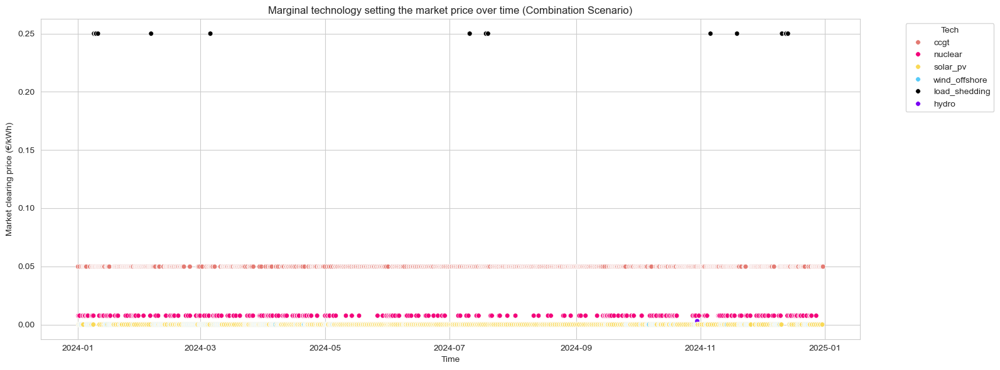

In [169]:
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(16, 6))

sns.scatterplot(
    data=marginal_tech_4,
    x='timesteps',
    y='marginal_generation_cost',
    hue='techs',
    palette=tech_colors,  
    s=30,  # marker size (larger than 18 for visibility)
    ax=ax
)

ax.set_xlabel("Time")
ax.set_ylabel("Market clearing price (€/kWh)")
ax.set_title("Marginal technology setting the market price over time (Combination Scenario)")
ax.legend(title="Tech", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

techs
ccgt             4303
solar_pv         3190
wind_offshore     714
nuclear           514
load_shedding      38
hydro               1
Name: count, dtype: int64
techs
ccgt             0.491210
solar_pv         0.364155
wind_offshore    0.081507
nuclear          0.058676
load_shedding    0.004338
hydro            0.000114
Name: share, dtype: float64
[2025-12-15 15:50:55] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_27956\3772032398.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



[2025-12-15 15:50:55] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_27956\3772032398.py:24: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.




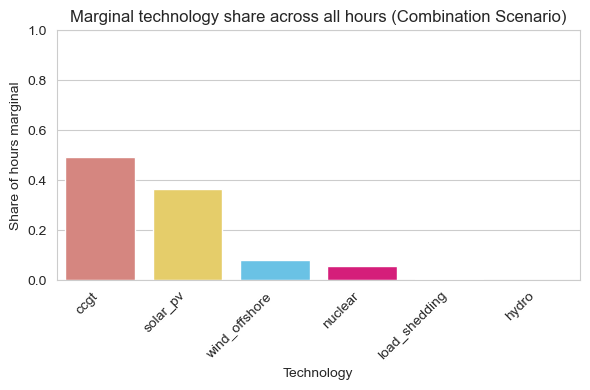

In [170]:
# Count how many hours each tech is marginal
freq = marginal_tech_4['techs'].value_counts().sort_values(ascending=False)
print(freq)
share = (freq / freq.sum()).rename('share')
print(share)

share_df = share.reset_index()
share_df.columns = ['techs', 'share']

fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=share_df,
    x='techs',
    y='share',
    palette=[tech_colors.get(tech, 'gray') for tech in share_df['techs']],
    ax=ax
)

ax.set_ylabel('Share of hours marginal')
ax.set_xlabel('Technology')
ax.set_ylim(0, 1)
ax.set_title('Marginal technology share across all hours (Combination Scenario)')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.show()

### 4.3. Dispatch per power plant type

In this example, we provide some pre-made plotting functionalities in the 'plotting_utilities.py' file, which you can import and apply as well as use as an example for making your own custom plots.

In [171]:
# Import some pre-made plotting functionalities as an example. You can use these, make your own, or simply
# create plots with your favourite Python library or non-Python tool, such as Excel
from plotting_utilities import plot_dispatch,plot_load_duration_curve

In [172]:
# Dispatch plots can be generated directly from the saved model results
plot_dispatch(model_path='results/combination.nc', plot_export_path='results/combination.html')

[2025-12-15 15:50:56] INFO     Model: preprocessing data (reentry)
[2025-12-15 15:50:56] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-15 15:50:56] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:50:56] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:50:56] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:50:56] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:50:56] INFO     Model: initialisation complete


### 4.4.  Load, residual load and price duration curves

In [173]:
gen_techs = ['solar_pv','wind_onshore', 'wind_offshore', 'hydro', 'ccgt', 'nuclear'] 

In [174]:
# For generating load duration curves (LDCs), instead, we first need to import back the model results,
# then extract the time-varing variable of interest
model_4 = calliope.read_netcdf('results/combination.nc')

[2025-12-15 15:50:57] INFO     Model: preprocessing data (reentry)
[2025-12-15 15:50:57] INFO     Math build | building applied math with ['base', 'operate'].
[2025-12-15 15:50:57] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:50:57] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:50:57] INFO     input data `color` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:50:57] INFO     input data `name` not defined in model math; it will not be available in the optimisation problem.
[2025-12-15 15:50:57] INFO     Model: initialisation complete


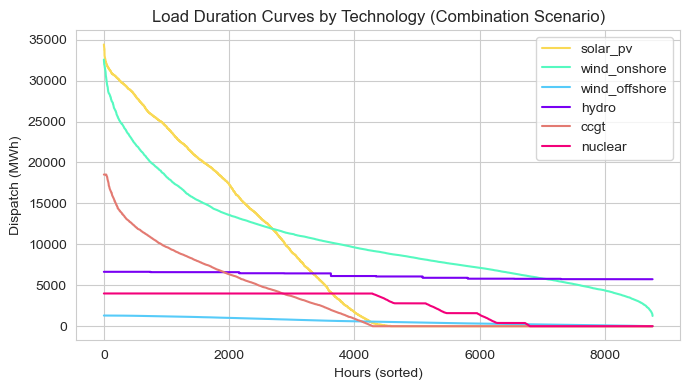

In [175]:
dispatch = {}
for tech in gen_techs:
    series = (
        model_4.results.flow_out
        .sel(techs=tech)        
        .to_series()
        .dropna()
        .sort_values(ascending=False)
        .reset_index(drop=True)
    )
    dispatch[tech] = series

# plot all LDCs for the different technologies
plt.figure(figsize=(7,4))

for tech, series in dispatch.items():
    plt.plot(series.values, label=tech, color=tech_colors.get(tech, 'black'))

plt.title("Load Duration Curves by Technology (Combination Scenario)")
plt.xlabel("Hours (sorted)")
plt.ylabel("Dispatch (MWh)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [176]:
# Or we may want the LDC of the shadow price, which we calculated earlier
plot_load_duration_curve(dataframe=balance_price_4['system_balance'].to_frame(), 
                         plot_export_path='results/combination_price.html', 
                         y_label='Price (EUR/kWh)')

In [177]:
# Obtain demand from input
demand_4 = model_4.inputs.sink_use_equals.sel(techs='demand_power').to_series().dropna()

# Get the dispatch of renewables
solar_pv_dispatch_4 = model_4.results.flow_out.sel(techs='solar_pv').to_series().dropna()
wind_onshore_dispatch_4 = model_4.results.flow_out.sel(techs='wind_onshore').to_series().dropna()
wind_offshore_dispatch_4 = model_4.results.flow_out.sel(techs='wind_offshore').to_series().dropna()

# Calculate the residual load (load minus renewable generation)
residual_load_4 = demand_4 - (solar_pv_dispatch_4 + wind_onshore_dispatch_4 + wind_offshore_dispatch_4)
residual_load_4.head()

timesteps            nodes  carriers
2024-01-01 00:00:00  NLD    power       12283.564587
2024-01-01 01:00:00  NLD    power       11929.840485
2024-01-01 02:00:00  NLD    power       11122.325411
2024-01-01 03:00:00  NLD    power       10392.195609
2024-01-01 04:00:00  NLD    power       10030.531002
dtype: float64

In [178]:
# Plot the LDC of the residual load
plot_load_duration_curve(dataframe=residual_load_4.to_frame(name='Residual Load (MWh)'),
                         plot_export_path='results/combination_residual_load.html',
                         y_label='Residual Load (MWh)')


### 4.5. CO2 emissions

In [179]:
# to get hourly generation for all techs, power carrier only
power_gen_4 = model_4.results.flow_out.sel(carriers="power")   # (nodes, techs, timesteps)

In [180]:
# emission factors (tCO2 per MWh of electricity)
emission_factors = {
    "ccgt": 0.42,   # only ccgt emits co2 emissions https://www.climatiq.io/data/emission-factor/7bfab478-b1e7-4ded-9907-9f200b40f2cb
}

In [181]:
# hourly emissions by tech (keep dict for possible future extra techs but this case only involves ccgt)
hourly_emissions_by_tech = {}
total_emissions_by_tech = {}

for tech, ef in emission_factors.items():
    # hourly generation for this tech (sum over nodes)
    gen_tech = power_gen_4.sel(techs=tech).sum(dim="nodes")      # (timesteps), MWh/h

    # hourly emissions (tCO2/h)
    emis_tech = gen_tech * ef                                  # DataArray over timesteps
    hourly_emissions_by_tech[tech] = emis_tech

    # total emissions over whole period
    total_emissions_by_tech[tech] = float(emis_tech.sum())     # tCO2


In [182]:
# Total across all emitting techs
total_emissions_t_4 = sum(total_emissions_by_tech.values())

print("CO2 emissions by tech:")
for tech, val in total_emissions_by_tech.items():
    print(f"  {tech}: {val:,.2f} tCO2")

print(f"\nTotal CO2 emissions: {total_emissions_t_4:,.2f} tCO2")
print(f"Total CO2 emissions: {total_emissions_t_4/1e6:.3f} MtCO2")

CO2 emissions by tech:
  ccgt: 11,840,667.76 tCO2

Total CO2 emissions: 11,840,667.76 tCO2
Total CO2 emissions: 11.841 MtCO2


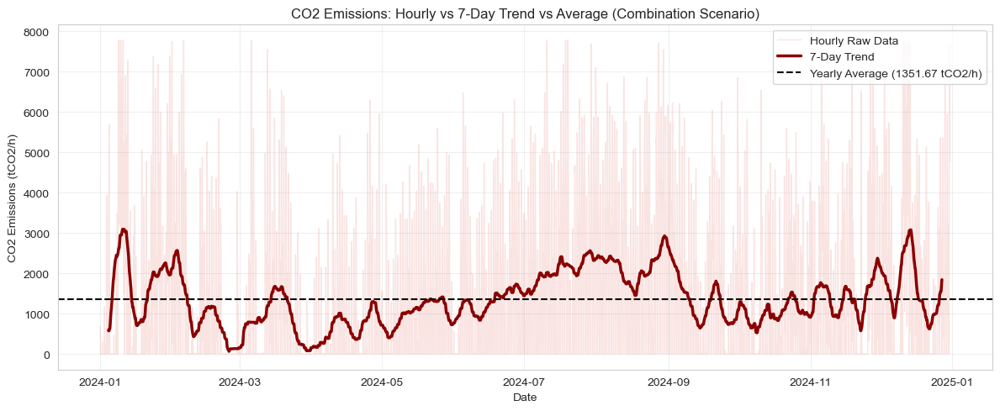

In [183]:
#plot
# convert to pandas Series with datetime index
ccgt_emissions = hourly_emissions_by_tech["ccgt"].to_series()
ccgt_emissions.index = pd.to_datetime(ccgt_emissions.index)

# 7-day rolling trend (168 hours)
trend_line = ccgt_emissions.rolling(window=168, center=True).mean()

# average over the whole period
average_val = ccgt_emissions.mean()

plt.figure(figsize=(12, 5))

# raw hourly data (faint)
plt.plot(
    ccgt_emissions.index,
    ccgt_emissions.values,
    color="#E37A72",
    alpha=0.2,
    linewidth=1,
    label="Hourly Raw Data",
)

# 7-day trend
plt.plot(
    trend_line.index,
    trend_line.values,
    color="darkred",
    linewidth=2.5,
    label="7-Day Trend",
)

# average line
plt.axhline(
    y=average_val,
    color="black",
    linestyle="--",
    linewidth=1.5,
    label=f"Yearly Average ({average_val:.2f} tCO2/h)",
)

plt.xlabel("Date")
plt.ylabel("CO2 Emissions (tCO2/h)")
plt.title("CO2 Emissions: Hourly vs 7-Day Trend vs Average (Combination Scenario)")
plt.legend(loc="upper right")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

### 4.6. Cost recovery

In [184]:
# Flow out for all gen techs in one go
dispatch = (
    model_4.results.flow_out
    .sel(techs=gen_techs, carriers='power')   # carriers only if present
    .to_series()                              # -> Series with index (nodes, techs, timesteps)
    .unstack('techs')                         # techs become columns
    .reset_index()                            # timesteps as column, keep nodes
)

dispatch.head()


techs,nodes,timesteps,solar_pv,wind_onshore,wind_offshore,hydro,ccgt,nuclear
0,NLD,2024-01-01 00:00:00,0.0,8570.138480,1009.713600,6645.575037,1637.990909,3999.999435
1,NLD,2024-01-01 01:00:00,0.0,8243.438625,1027.387557,6645.575037,1284.266870,3999.999361
2,NLD,2024-01-01 02:00:00,0.0,7927.889315,982.868607,6645.575037,476.751678,3999.999340
3,NLD,2024-01-01 03:00:00,0.0,7584.111715,891.359343,6645.575037,0.001108,3746.623897
4,NLD,2024-01-01 04:00:00,0.0,7282.935865,823.699800,6645.575037,0.001091,3384.959453


In [185]:
# Shadow price dataframe
balance_price_4 = (
    model_4.results.shadow_price_system_balance
    .to_series().reset_index()
)

# Merge price into dispatch
df_4 = balance_price_4.merge(dispatch, on='timesteps', how='left')
df_4.head()

,nodes_x,carriers,timesteps,shadow_price_system_balance,nodes_y,solar_pv,wind_onshore,wind_offshore,hydro,ccgt,nuclear
0,NLD,power,2024-01-01 00:00:00,0.049768,NLD,0.0,8570.138480,1009.713600,6645.575037,1637.990909,3999.999435
1,NLD,power,2024-01-01 01:00:00,0.049768,NLD,0.0,8243.438625,1027.387557,6645.575037,1284.266870,3999.999361
2,NLD,power,2024-01-01 02:00:00,0.049768,NLD,0.0,7927.889315,982.868607,6645.575037,476.751678,3999.999340
3,NLD,power,2024-01-01 03:00:00,0.007627,NLD,0.0,7584.111715,891.359343,6645.575037,0.001108,3746.623897
4,NLD,power,2024-01-01 04:00:00,0.007627,NLD,0.0,7282.935865,823.699800,6645.575037,0.001091,3384.959453


In [186]:
# Revenue per tech = price * dispatch (hourly)
for tech in gen_techs:
    df_4[f'{tech}_revenue'] = df_4[tech] * df_4['shadow_price_system_balance']

# Total (modelled-period) revenue per tech
revenue_4 = df_4[[f'{t}_revenue' for t in gen_techs]].sum()
revenue_4.index = revenue_4.index.str.replace('_revenue', '', regex=False)
revenue_4.name = 'revenue'
revenue_4

solar_pv         2.877514e+05
wind_onshore     1.938355e+06
wind_offshore    1.162085e+05
hydro            1.408876e+06
ccgt             1.544005e+06
nuclear          9.087648e+05
Name: revenue, dtype: float64

In [187]:
cost_4 = (
    model_4.results.cost
    .sel(techs=gen_techs)   # we only care about these
    .sum('nodes')           # if you only have one node, this just drops the dim
    .to_series()
)
cost_4 = cost_4.droplevel('costs')                # or just drop the level
cost_4.name = 'cost'
cost_4

techs
solar_pv         7.168373e+02
wind_onshore     1.390053e+05
wind_offshore    1.137641e+02
hydro            1.619549e+05
ccgt             1.403075e+06
nuclear          1.659036e+05
Name: cost, dtype: float64

In [188]:
# calculate profit and cost recovery ratio
covery_4 = pd.concat([revenue_4, cost_4], axis=1)
covery_4['profit'] = covery_4['revenue'] - covery_4['cost'] # >0 means revenue covers cost
covery_4['cost_recovery_ratio'] = covery_4['revenue'] / covery_4['cost']  # >1 means full recovery
covery_4

,revenue,cost,profit,cost_recovery_ratio
solar_pv,2.877514e+05,7.168373e+02,2.870346e+05,401.417991
wind_onshore,1.938355e+06,1.390053e+05,1.799350e+06,13.944469
wind_offshore,1.162085e+05,1.137641e+02,1.160948e+05,1021.487144
hydro,1.408876e+06,1.619549e+05,1.246921e+06,8.699187
ccgt,1.544005e+06,1.403075e+06,1.409300e+05,1.100444
nuclear,9.087648e+05,1.659036e+05,7.428611e+05,5.477667


In [189]:
covery_df_4 = covery_4.reset_index()
covery_df_4.columns = ['techs', 'revenue', 'cost', 'profit', 'cost_recovery_ratio']
covery_df_4

,techs,revenue,cost,profit,cost_recovery_ratio
0,solar_pv,2.877514e+05,7.168373e+02,2.870346e+05,401.417991
1,wind_onshore,1.938355e+06,1.390053e+05,1.799350e+06,13.944469
2,wind_offshore,1.162085e+05,1.137641e+02,1.160948e+05,1021.487144
3,hydro,1.408876e+06,1.619549e+05,1.246921e+06,8.699187
4,ccgt,1.544005e+06,1.403075e+06,1.409300e+05,1.100444
5,nuclear,9.087648e+05,1.659036e+05,7.428611e+05,5.477667


[2025-12-15 15:50:58] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_27956\4220533698.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



[2025-12-15 15:50:58] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_27956\4220533698.py:16: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.




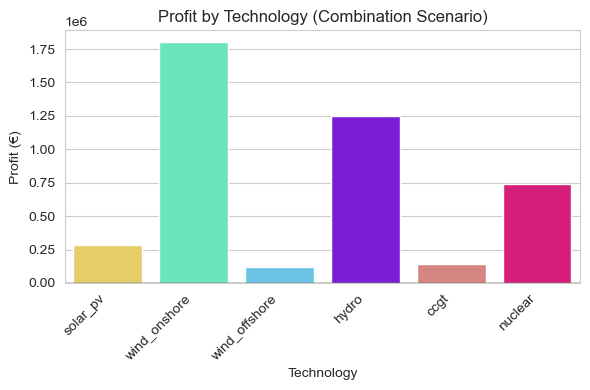

[2025-12-15 15:50:58] WARNING  C:\Users\yaowa\AppData\Local\Temp\ipykernel_27956\4220533698.py:24: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.





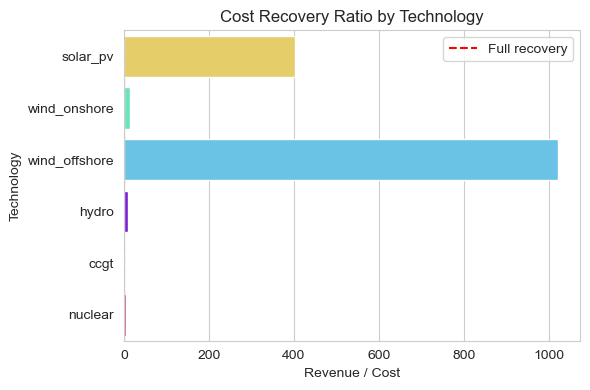

In [190]:
# --- FIGURE 1: PROFIT ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df_4,
    x="techs",
    y="profit",
    palette=tech_colors,   # use tech-specific colors
    ax=ax
)

ax.axhline(0, color="black", linewidth=1)
ax.set_title("Profit by Technology (Combination Scenario)")
ax.set_ylabel("Profit (€)")
ax.set_xlabel("Technology")
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

plt.tight_layout()
plt.show()

# --- FIGURE 2: COST RECOVERY RATIO ---
fig, ax = plt.subplots(figsize=(6, 4))

sns.barplot(
    data=covery_df_4,
    y="techs",
    x="cost_recovery_ratio",
    palette=tech_colors,   # same colors, consistent across figures
    ax=ax
)

ax.axvline(1.0, color="red", linestyle="--", linewidth=1.5, label="Full recovery")
ax.set_title("Cost Recovery Ratio by Technology")
ax.set_xlabel("Revenue / Cost")
ax.set_ylabel("Technology")
ax.legend()

plt.tight_layout()
plt.show()